# Sentiment Analysis

In [10]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.ioff()  # Desativa modo interativo automático 

import pandas as pd
import numpy as np
import seaborn as sns
import os
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import RSLPStemmer
from nltk.tokenize import word_tokenize
from leia import SentimentIntensityAnalyzer
from IPython.display import display

## Funções auxiliares compartilhadas

Segmentação de sentenças, agrupamento em blocos, máscaras de idioma e conversão de números em formato brasileiro. Definidas **uma única vez** e usadas por todos os analisadores, para que a comparação entre algoritmos varie apenas o motor de sentimento.


In [11]:
# =============================================================================
# FUNCOES AUXILIARES COMPARTILHADAS
# Definidas uma unica vez e usadas por TODOS os analisadores (LeIA, VADER e
# multilingue). Isso garante que a comparacao entre algoritmos seja justa: o
# unico elemento que varia entre eles e o motor de sentimento, nunca a forma
# como o texto foi partido em sentencas e blocos.
# =============================================================================
import re

# --- 1. Segmentacao de sentencas --------------------------------------------
# O regex antigo -- re.split(r'(?<=[.!?])\s+(?=[A-Z])', texto) -- falhava de
# duas maneiras opostas na prosa juridica:
#   (a) SUPERDIVIDIA: "Rel. Min. Edson Fachin" virava tres sentencas, porque o
#       ponto de abreviatura e seguido de maiuscula;
#   (b) SUBDIVIDIA: [A-Z] nao inclui maiusculas acentuadas, entao sentencas
#       iniciadas por "E", "Orgao", "Insito" jamais comecavam bloco novo.
# Como todas as metricas sao calculadas sobre blocos, qualquer erro aqui
# desloca TODOS os escores. As listas abaixo cobrem as abreviaturas correntes
# na linguagem forense dos dois paises.

ABREVIATURAS_PT = {
    'art', 'arts', 'inc', 'incs', 'al', 'par', 'p', 'pp', 'fl', 'fls', 'n',
    'no', 'nos', 'num', 'min', 'mins', 'rel', 'red', 'des', 'dr', 'dra', 'sr',
    'sra', 'srs', 'exmo', 'exma', 'proc', 'procs', 'req', 'reqte', 'reqda',
    'cf', 'cc', 'cpc', 'cpp', 'clt', 'ctn', 'adct', 'ed', 'eds', 'org', 'orgs',
    'trad', 'coord', 'cit', 'op', 'ss', 'seg', 'segs', 'etc', 'vol', 'cap',
    'ap', 'adi', 'adpf', 'adc', 'ado', 'hc', 'rhc', 'ms', 're', 'are', 'ag',
    'agr', 'ed', 'rcl', 'inq', 'pet', 'acp', 'stf', 'stj', 'tst', 'tse', 'pgr',
    'jan', 'fev', 'mar', 'abr', 'mai', 'jun', 'jul', 'ago', 'set', 'out',
    'nov', 'dez',
}

ABREVIATURAS_EN = {
    'no', 'nos', 'art', 'arts', 'sec', 'secs', 'para', 'paras', 'p', 'pp',
    'cf', 'id', 'ibid', 'e.g', 'i.e', 'al', 'v', 'vs', 'mr', 'mrs', 'ms',
    'dr', 'jr', 'sr', 'st', 'ch', 'cl', 'amend', 'const', 'stat', 'supra',
    'infra', 'ante', 'ed', 'eds', 'rev', 'ann', 'dist', 'cir', 'ct', 'u.s',
    'f.2d', 'f.3d', 's.ct', 'l.ed', 'n.w', 'n.e', 's.w', 's.e', 'cong',
    'jan', 'feb', 'mar', 'apr', 'jun', 'jul', 'aug', 'sep', 'sept', 'oct',
    'nov', 'dec',
}

# Maiusculas latinas COM acento (A-Z nao as inclui) e aberturas de citacao
_INICIO_DE_SENTENCA = r'A-ZÀ-ÖØ-Þ0-9"“‘«('
_PADRAO_QUEBRA = re.compile(rf'(?<=[.!?])\s+(?=[{_INICIO_DE_SENTENCA}])')
_TOKEN_FINAL = re.compile(r'([\w\.]+)\.\s*$')


def _termina_em_abreviatura(fragmento, abreviaturas):
    """True se o fragmento termina em abreviatura ou inicial (ex.: 'J.', 'art.')."""
    m = _TOKEN_FINAL.search(fragmento)
    if not m:
        return False
    token = m.group(1).lower().rstrip('.')
    if len(token) <= 1:          # inicial de nome proprio: "J. Alito", "B. P. J."
        return True
    return token in abreviaturas


def segmentar_sentencas(texto, abreviaturas):
    """Parte o texto em sentencas respeitando abreviaturas e acentuacao."""
    if not isinstance(texto, str) or not texto.strip():
        return []
    sentencas, acumulado = [], ''
    for pedaco in _PADRAO_QUEBRA.split(texto):
        acumulado = f'{acumulado} {pedaco}'.strip() if acumulado else pedaco
        if _termina_em_abreviatura(acumulado, abreviaturas):
            continue             # o ponto era de abreviatura: a sentenca continua
        sentencas.append(acumulado)
        acumulado = ''
    if acumulado:
        sentencas.append(acumulado)
    return sentencas


# --- 2. Agrupamento em blocos -----------------------------------------------
# Parametros explicitos, porque sao escolhas metodologicas e nao detalhes de
# implementacao. TAMANHO_BLOCO e a granularidade da analise; MIN_CARACTERES
# descarta fragmentos curtos demais para produzir um escore estavel.
TAMANHO_BLOCO = 3
MIN_CARACTERES_BLOCO = 10


def dividir_em_blocos(texto, abreviaturas, tamanho_bloco=TAMANHO_BLOCO,
                      min_caracteres=MIN_CARACTERES_BLOCO):
    """Devolve a lista de blocos de texto prontos para pontuacao."""
    sentencas = segmentar_sentencas(texto, abreviaturas)
    blocos = [' '.join(sentencas[i:i + tamanho_bloco])
              for i in range(0, len(sentencas), tamanho_bloco)]
    return [b for b in blocos if len(b) > min_caracteres]


# --- 3. Mascaras de idioma ---------------------------------------------------
# O codigo antigo usava OR: (pais == 'Brasil') | (corte == 'STF'). Com OR, uma
# linha com pais='Brasil' e corte='SCOTUS' cairia nos DOIS grupos e seria
# pontuada duas vezes, prevalecendo a ultima. Com AND, cada voto cai em no
# maximo um grupo -- e um par pais/corte inconsistente aparece no aviso em vez
# de passar despercebido.
def mascaras_idioma(dados, verbose=True):
    """Devolve (mascara_portugues, mascara_ingles) e denuncia linhas orfas."""
    pt = (dados['pais'] == 'Brasil') & (dados['corte'] == 'STF')
    en = (dados['pais'] == 'EUA') & (dados['corte'] == 'SCOTUS')
    orfas = ~(pt | en)
    if verbose and orfas.any():
        print(f"[ATENCAO] {int(orfas.sum())} voto(s) com par pais/corte nao "
              f"reconhecido - ficarao SEM escore de sentimento:")
        print(dados.loc[orfas, ['id', 'pais', 'corte']].to_string(index=False))
    return pt, en


# --- 4. Conversao de numeros em formato brasileiro ---------------------------
def _exige_texto(serie, nome):
    """Impede a conversao de uma coluna que o pandas ja parseou como numero.

    Se o CSV for lido sem dtype=str, o pandas transforma "4.452" em 4.452 e
    "158" em 158.0 ANTES de chegarmos aqui -- e nesse ponto a informacao sobre
    onde estava o separador de milhar ja se perdeu. Por isso a leitura do CSV
    traz estas colunas como texto.
    """
    import pandas as pd
    if pd.api.types.is_numeric_dtype(serie):
        raise TypeError(
            f"A coluna '{nome}' chegou ja convertida em numero. Leia o CSV com "
            f"dtype={{'reperc_absoluta': str, 'indice_reperc': str}} para que o "
            f"separador de milhar seja interpretado corretamente."
        )


def para_float_br(serie, nome='indice_reperc'):
    """Texto -> float aceitando virgula decimal e ponto de milhar.

    '0,035' -> 0.035   |   '1' -> 1.0   |   '0.443' -> 0.443
    Quando ha virgula, o ponto e tratado como separador de milhar; quando nao
    ha, o ponto e mantido como separador decimal.
    """
    import pandas as pd
    _exige_texto(serie, nome)
    s = serie.astype(str).str.strip()
    tem_virgula = s.str.contains(',', regex=False)
    convertida = (s.str.replace('.', '', regex=False)
                   .str.replace(',', '.', regex=False))
    return pd.to_numeric(s.where(~tem_virgula, convertida), errors='coerce')


def para_int_br(serie, nome='reperc_absoluta'):
    """Contagens inteiras: o ponto e SEMPRE separador de milhar.

    '4.452' -> 4452 (e nao 4.452, que era como o Python lia antes).
    """
    import pandas as pd
    _exige_texto(serie, nome)
    s = (serie.astype(str).str.strip()
               .str.replace('.', '', regex=False)
               .str.replace(',', '', regex=False))
    return pd.to_numeric(s, errors='coerce').astype('Int64')


print("Funcoes auxiliares carregadas: segmentar_sentencas, dividir_em_blocos,")
print("mascaras_idioma, para_float_br, para_int_br.")


Funcoes auxiliares carregadas: segmentar_sentencas, dividir_em_blocos,
mascaras_idioma, para_float_br, para_int_br.


In [12]:
# =============================================================================
# LEITURA DA BASE
# Caminho portatil: procura o CSV na variavel de ambiente TESE_DIR, depois na
# pasta do proprio notebook, e so entao no caminho absoluto antigo. Assim o
# notebook roda em qualquer maquina -- requisito de reprodutibilidade.
# =============================================================================
from pathlib import Path

CANDIDATOS = [
    Path(os.environ.get('TESE_DIR', '')) / 'A1_A_DF.csv',
    Path.cwd() / 'A1_A_DF.csv',
    Path(r'C:\Users\ccsra\OneDrive\Documentos\A_TESE_TUDO\PROJETO\A1_A_DF.csv'),
]
CSV_ENTRADA = next((c for c in CANDIDATOS if c.is_file()), None)
if CSV_ENTRADA is None:
    raise FileNotFoundError(
        'A1_A_DF.csv nao encontrado. Defina a variavel de ambiente TESE_DIR '
        'com a pasta do projeto, ou coloque o CSV ao lado deste notebook.\n'
        'Procurei em:\n  ' + '\n  '.join(str(c) for c in CANDIDATOS)
    )

PASTA_PROJETO = CSV_ENTRADA.parent
print(f'Lendo base de: {CSV_ENTRADA}')

# encoding utf-8-sig remove o BOM que o Excel grava no inicio do arquivo
# dtype=str nas colunas numericas: sem isso, o pandas parseia "4.452" como
# 4.452 e "158" como 158.0 antes de podermos interpretar o separador de milhar.
df = pd.read_csv(CSV_ENTRADA, sep=';', encoding='utf-8-sig',
                 dtype={'reperc_absoluta': str, 'indice_reperc': str})

# --- conversao numerica em um unico lugar ------------------------------------
# reperc_absoluta vem com ponto de MILHAR ("4.452"). Lido como float, o Python
# entenderia 4,452 -- um erro silencioso de tres ordens de grandeza.
# indice_reperc vem com virgula DECIMAL ("0,035").
df['reperc_absoluta'] = para_int_br(df['reperc_absoluta'])
df['indice_reperc'] = para_float_br(df['indice_reperc'])

print(df[['id', 'pais', 'corte', 'caso', 'reperc_absoluta', 'indice_reperc']].head())
print(f"\nreperc_absoluta: min={df['reperc_absoluta'].min()}, "
      f"max={df['reperc_absoluta'].max()}")
print(f"indice_reperc:   min={df['indice_reperc'].min():.3f}, "
      f"max={df['indice_reperc'].max():.3f}")

# Checagem dura: um separador de milhar mal lido e um erro silencioso de tres
# ordens de grandeza. Melhor falhar alto do que seguir com o dado errado.
assert df['reperc_absoluta'].min() >= 1, 'contagem de materias menor que 1'
assert df['indice_reperc'].between(0, 1).all(), 'indice de repercussao fora de [0, 1]'
if df['reperc_absoluta'].isna().any() or df['indice_reperc'].isna().any():
    raise ValueError('Ha valores nao convertidos em reperc_absoluta/indice_reperc:\n'
                     + str(df.loc[df['reperc_absoluta'].isna()
                                  | df['indice_reperc'].isna(),
                                  ['id', 'caso', 'reperc_absoluta', 'indice_reperc']]))

# =============================================================================
# RECODIFICACAO DO TIPO DE MANIFESTACAO
# Feita aqui, logo apos a leitura da base, para que 'tipo_manifestacao' exista
# desde o inicio do DataFrame e seja usada em todo o restante do notebook no
# lugar de 'relator_ou_vogal'. As categorias originais de 'relator_ou_vogal'
# nao se sobrepoem entre os paises e identificam perfeitamente 'pais', o que
# tornaria o OLS colinear; esta recodificacao produz um contraste
# funcionalmente equivalente nos dois sistemas.
# =============================================================================
CONDUTORAS = {'Relator', 'Court_Opinion'}

df['tipo_manifestacao'] = np.where(
    df['relator_ou_vogal'].isin(CONDUTORAS), 'Condutora', 'Separada'
)

print(pd.crosstab(df['pais'], df['tipo_manifestacao'], margins=True))
print()
print(pd.crosstab(df['relator_ou_vogal'], df['tipo_manifestacao']))


Lendo base de: A1_A_DF.csv
   id    pais corte    caso  reperc_absoluta  indice_reperc
0   1  Brasil   STF  AP1025              158          0.035
1   2  Brasil   STF  AP1025              158          0.035
2   3  Brasil   STF  AP1025              158          0.035
3   4  Brasil   STF  AP1025              158          0.035
4   5  Brasil   STF  AP1025              158          0.035

reperc_absoluta: min=1, max=4452
indice_reperc:   min=0.000, max=1.000
tipo_manifestacao  Condutora  Separada  All
pais                                       
Brasil                     7        54   61
EUA                        4        12   16
All                       11        66   77

tipo_manifestacao      Condutora  Separada
relator_ou_vogal                          
Concurring                     0         6
Court_Opinion                  4         0
Dissenting                     0         4
Dissenting&Concurring          0         2
Relator                        7         0
Vogal              

## Extraindo os votos dos arquivos.txt da base de dados.csv

In [13]:
# 1. Defina uma função para carregar o texto
def carregar_texto_do_arquivo(caminho_no_csv):
    """
    Recebe o caminho da coluna 'voto' (ex: 'PASTA_DADOS/arquivo.txt'),
    encontra o nome do arquivo (ex: 'arquivo.txt') e lê seu conteúdo.
    """
    if pd.isna(caminho_no_csv):
        return None # Retorna nulo se o caminho estiver vazio
    
    # Esta é a parte chave:
    # O CSV diz 'PASTA_DADOS/ARQUIVOTAL.txt'
    # os.path.basename() pega apenas o nome do arquivo do caminho.
    nome_arquivo = os.path.basename(caminho_no_csv)
    
    try:
        # Tenta abrir o arquivo (assumindo que ele está na mesma pasta do seu notebook)
        with open(nome_arquivo, 'r', encoding='utf-8') as f:
            texto = f.read()
        return texto # Retorna o texto completo
        
    except FileNotFoundError:
        print(f"Aviso: Arquivo '{nome_arquivo}' não encontrado. Verifique o nome.")
        return f"ERRO: Arquivo '{nome_arquivo}' não encontrado"
    except Exception as e:
        print(f"Erro ao ler '{nome_arquivo}': {e}")
        return f"ERRO: {e}"

# 2. Crie a nova coluna 'texto_completo'
print("\nIniciando o carregamento dos textos do arquivo .txt para o DataFrame...")

# Verificamos se 'voto' existe no DataFrame 'df'
if 'voto' in df.columns:
    # O método 'apply' vai executar a função 'carregar_texto_do_arquivo'
    # para CADA linha da coluna 'voto'.
    df['texto_completo'] = df['voto'].apply(carregar_texto_do_arquivo)
    
    print("Carregamento concluído!")

    # 3. Verifique o resultado
    print("\nDataFrame 'dados' agora com a coluna 'texto_completo':")
    # (O .applymap abaixo é apenas para encurtar a exibição na tela)
    print(df[['id', 'voto', 'texto_completo']].head().map(lambda x: str(x)[:80] + '...' if isinstance(x, str) and len(x) > 80 else x))
      
else:
    print(f"\nERRO: A coluna 'voto' não foi encontrada no seu DataFrame 'dados'.")
    print("Colunas disponíveis:", df.columns.tolist())


Iniciando o carregamento dos textos do arquivo .txt para o DataFrame...
Carregamento concluído!

DataFrame 'dados' agora com a coluna 'texto_completo':
   id                         voto  \
0   1   PROJETO/AP_1025_FACHIN.txt   
1   2   PROJETO/AP_1025_MORAES.txt   
2   3  PROJETO/AP_1025_BARROSO.txt   
3   4   PROJETO/AP_1025_CARMEN.txt   
4   5   PROJETO/AP_1025_GILMAR.txt   

                                      texto_completo  
0  O SENHOR MINISTRO EDSON FACHIN (RELATOR): Conf...  
1  O SENHOR MINISTRO ALEXANDRE DE MORAES (REVISOR...  
2  O SENHOR MINISTRO LUÍS ROBERTO BARROSO - Obrig...  
3  A SENHORA MINISTRA CÁRMEN LÚCIA -\nPresidente,...  
4  O Senhor Ministro Gilmar Mendes: Trata-se de a...  


## Verificando as primeiras linhas de cada um dos votos com o texto bruto

In [ ]:
# Itera sobre as 6 primeiras linhas do DataFrame para mostrar um resumo
for index, row in df.head(20).iterrows():
    print(f"--- Início do Voto ID: {row['id']} (Juiz: {row['juiz']}) ---")
    
    texto = row['texto_completo']
    
    # Verifica se o texto foi carregado corretamente
    if isinstance(texto, str) and not texto.startswith("ERRO"):
        # Divide o texto em linhas e pega as 6 primeiras
        primeiras_linhas = texto.split('\n')[:6]
        # Junta as linhas de volta em uma única string para exibição
        resumo_texto = '\n'.join(primeiras_linhas)
        print(resumo_texto)
        print("...\n")
    elif texto:
        # Se houver uma mensagem de erro, mostre-a
        print(texto)
        print("\n")
    else:
        # Caso o texto esteja vazio ou nulo
        print("Texto não disponível.\n")

## Verificando as últimas linhas de cada voto com o texto bruto

In [ ]:
# Itera sobre as primeiras 20 linhas do DataFrame e mostra um resumo (últimas 5 linhas de cada voto)
for index, row in df.head(20).iterrows():
    print(f"--- Final do Voto ID: {row.get('id','?')} (Juiz: {row.get('juiz','?')}) ---")
    texto = row.get('texto_completo', '')
    # Verifica se o texto foi carregado corretamente
    if isinstance(texto, str) and not texto.startswith("ERRO"):
        # Divide o texto em linhas e pega as últimas 5
        linhas = texto.split('\n')
        ultimas_linhas = linhas[-5:] if len(linhas) >= 5 else linhas
        # Junta as linhas de volta em uma única string para exibição
        resumo_texto = '\n'.join(ultimas_linhas)
        print(resumo_texto)
        print("...\n")
    elif texto:
        # Se houver uma mensagem de erro, mostre-a
        print(texto)
        print("\n")
    else:
        # Caso o texto esteja vazio ou nulo
        print("Texto não disponível.\n")

## Configurações de visualização

## Definindo as funções de limpeza (Português)

In [14]:
class TextCleaner:
    """
    Responsável por todas as estratégias de limpeza de texto.
    """
    def __init__(self):
        self.stop_words = set(stopwords.words('portuguese'))
        
        # Stopwords específicas do contexto jurídico (ruído)
        termos_juridicos_irrelevantes = {
            'voto', 'senhor', 'ministro', 'presidente', 'excelencia', 'sessao',
            'turma', 'supremo', 'tribunal', 'federal', 'ata', 'publi', 'dj'
        }
        self.stop_words.update(termos_juridicos_irrelevantes)

    def limpeza_pesada(self, texto):
        """
        OBJETIVO: Gerar dados para modelagem de tópicos, nuvem de palavras ou clusterização.
        AÇÕES: Lowercase -> Remove Pontuação/Núm -> Remove Stopwords (sem stemming).
        """
        if not isinstance(texto, str): return ""
        
        # 1. Normalização
        texto = texto.lower()
        
        # 2. Remover caracteres especiais e números (mantém apenas letras)
        texto = re.sub(r'[^a-záàâãéèêíïóôõöúçñ\s]', '', texto)
        
        # 3. Tokenização
        tokens = word_tokenize(texto, language='portuguese')
        
        # 4. Filtragem (sem stemming para manter palavras legíveis)
        tokens_limpos = [
            t for t in tokens 
            if t not in self.stop_words and len(t) > 2
        ]
        
        return " ".join(tokens_limpos)

    def limpeza_leve_sentimento(self, texto):
        """
        OBJETIVO: Preparar texto para o LeIA (Sentiment Analysis).
        AÇÕES: Preserva pontuação (!?), acentuação e estrutura de frases. Remove apenas sujeira de formatação.
        """
        if not isinstance(texto, str): return ""
        
        # Remove quebras de linha excessivas e espaços múltiplos
        texto = re.sub(r'\s+', ' ', texto).strip()
        return texto

## Definindo as funções de limpeza (English)

In [15]:
from nltk.stem import PorterStemmer

class TextCleanerEnglish:
    """
    Responsável por todas as estratégias de limpeza de texto em inglês.
    """
    def __init__(self):
        self.stop_words = set(stopwords.words('english'))
        
        # Stopwords específicas do contexto jurídico em inglês (ruído)
        termos_juridicos_irrelevantes = {
            'vote', 'justice', 'chief', 'justice', 'justices', 'justice', 'court',
            'supreme', 'federal', 'circuit', 'appeal', 'judge', 'mr', 'ms', 'dr',
            'opinion', 'case', 'held', 'said', 'shall', 'may', 'hereby'
        }
        self.stop_words.update(termos_juridicos_irrelevantes)

    def limpeza_pesada(self, texto):
        """
        OBJETIVO: Gerar dados para modelagem de tópicos, nuvem de palavras ou clusterização.
        AÇÕES: Lowercase -> Remove Pontuação/Núm -> Remove Stopwords (sem stemming).
        """
        if not isinstance(texto, str): return ""
        
        # 1. Normalização
        texto = texto.lower()
        
        # 2. Remover caracteres especiais e números (mantém apenas letras para inglês)
        texto = re.sub(r'[^a-z\s]', '', texto)
        
        # 3. Tokenização
        tokens = word_tokenize(texto, language='english')
        
        # 4. Filtragem (sem stemming para manter palavras legíveis)
        tokens_limpos = [
            t for t in tokens 
            if t not in self.stop_words and len(t) > 2
        ]
        
        return " ".join(tokens_limpos)

    def limpeza_leve_sentimento(self, texto):
        """
        OBJETIVO: Preparar texto para análise de sentimentos em inglês.
        AÇÕES: Preserva pontuação (!?), capitalização e estrutura de frases. Remove apenas sujeira de formatação.
        """
        if not isinstance(texto, str): return ""
        
        # Remove quebras de linha excessivas e espaços múltiplos
        texto = re.sub(r'\s+', ' ', texto).strip()
        return texto

## Aplicando a limpeza para Análise de Sentimentos (Português)

In [16]:
# Instancia o limpador de texto
cleaner = TextCleaner()

# Cria máscara para filtrar apenas votos em português (Brasil ou STF)
mascara_portugues, _ = mascaras_idioma(df)

# Aplica a limpeza leve (para análise de sentimento) na coluna 'texto_completo' e armazena o resultado em uma nova coluna.
# NOTA: Processamento realizado APENAS para votos em português (pais='Brasil' ou corte='STF')
df['texto_limpo_sentimento'] = ''
df.loc[mascara_portugues, 'texto_limpo_sentimento'] = df.loc[mascara_portugues, 'texto_completo'].apply(cleaner.limpeza_leve_sentimento)

# Verificando as primeiras linhas para garantir que a limpeza foi aplicada
import textwrap

def visualizar_texto_limpo(df, n_linhas=6, wrap_width=100, max_wrapped_lines=6):
    print("--- VISUALIZAÇÃO ---\n")
    for _, row in df.head(n_linhas).iterrows():
        id_voto = row.get('id', '')
        juiz = row.get('juiz', '')
        texto = row.get('texto_limpo_sentimento', '') or ''
        print("="*80)
        print(f"ID: {id_voto} | Juiz: {juiz}")
        print("-"*80)
        if not texto.strip():
            print("⚠️  Texto vazio ou não processado corretamente\n")
            continue

        # Quebra o texto limpo em linhas visíveis
        wrapped = textwrap.wrap(texto, width=wrap_width)
        for i, linha in enumerate(wrapped[:max_wrapped_lines], start=1):
            print(f"{i}. {linha}")
        if len(wrapped) > max_wrapped_lines:
            print(f"... (+{len(wrapped) - max_wrapped_lines} linhas adicionais)")

        # Mostra também um preview contínuo (útil para confirmar limpeza)
        preview_chars = 300
        preview = texto[:preview_chars] + ("..." if len(texto) > preview_chars else "")
        print("\n--- Preview contínuo (primeiros %d chars) ---" % preview_chars)
        print(preview)
        print("\n")

# Chama a função apenas com dados em português
visualizar_texto_limpo(df[mascara_portugues], n_linhas=6, wrap_width=100, max_wrapped_lines=6)

--- VISUALIZAÇÃO ---

ID: 1 | Juiz: Fachin
--------------------------------------------------------------------------------
1. O SENHOR MINISTRO EDSON FACHIN (RELATOR): Conforme relatado, trata-se de Ação Penal deflagrada
2. contra Fernando Affonso Collor de Mello, Pedro Paulo Bergamaschi de Leoni Ramos e Luis Pereira
3. Duarte de Amorim, na qual a Procuradoria-Geral da República lhes atribui a prática de crimes de
4. corrupção passiva, lavagem de dinheiro e organização criminosa. Segundo o Ministério Público
5. Federal, entre os anos de 2010 e 2014, identificou-se a atuação de complexa organização criminosa na
6. Petrobras Distribuidora S/A - BR Distribuidora S/A, sobre a qual exerciam decisiva influência
... (+1889 linhas adicionais)

--- Preview contínuo (primeiros 300 chars) ---
O SENHOR MINISTRO EDSON FACHIN (RELATOR): Conforme relatado, trata-se de Ação Penal deflagrada contra Fernando Affonso Collor de Mello, Pedro Paulo Bergamaschi de Leoni Ramos e Luis Pereira Duarte de Amorim

## Aplicando a limpeza para Análise de Sentimentos (English)

In [17]:
# Instancia o limpador de texto em inglês
cleaner_en = TextCleanerEnglish()

# Cria máscara para filtrar apenas votos em inglês (EUA ou SCOTUS)
_, mascara_ingles = mascaras_idioma(df)

# Aplica a limpeza leve (para análise de sentimento) na coluna 'texto_completo' e armazena o resultado em uma nova coluna.
# NOTA: Processamento realizado APENAS para votos em inglês (pais='EUA' ou corte='SCOTUS')
df['texto_limpo_sentimento_en'] = ''
df.loc[mascara_ingles, 'texto_limpo_sentimento_en'] = df.loc[mascara_ingles, 'texto_completo'].apply(cleaner_en.limpeza_leve_sentimento)

# Função para visualizar texto limpo em inglês
def visualizar_texto_limpo_en(df, n_linhas=6, wrap_width=100, max_wrapped_lines=6):
    print("--- VISUALIZAÇÃO (ENGLISH) ---\n")
    for _, row in df.head(n_linhas).iterrows():
        id_voto = row.get('id', '')
        juiz = row.get('juiz', '')
        texto = row.get('texto_limpo_sentimento_en', '') or ''
        print("="*80)
        print(f"ID: {id_voto} | Judge: {juiz}")
        print("-"*80)
        if not texto.strip():
            print("⚠️  Text empty or not processed correctly\n")
            continue

        # Quebra o texto limpo em linhas visíveis
        wrapped = textwrap.wrap(texto, width=wrap_width)
        for i, linha in enumerate(wrapped[:max_wrapped_lines], start=1):
            print(f"{i}. {linha}")
        if len(wrapped) > max_wrapped_lines:
            print(f"... (+{len(wrapped) - max_wrapped_lines} additional lines)")

        # Mostra também um preview contínuo (útil para confirmar limpeza)
        preview_chars = 300
        preview = texto[:preview_chars] + ("..." if len(texto) > preview_chars else "")
        print("\n--- Continuous preview (first %d chars) ---" % preview_chars)
        print(preview)
        print("\n")

# Chama a função apenas com dados em inglês
visualizar_texto_limpo_en(df[mascara_ingles], n_linhas=6, wrap_width=100, max_wrapped_lines=6)

--- VISUALIZAÇÃO (ENGLISH) ---

ID: 62 | Judge: Alito
--------------------------------------------------------------------------------
1. With just over one million residents, Montgomery County is Maryland's most populous county.
2. According to a recent survey, it is also the “most religiously diverse county” in the Nation. 1 In
3. addition to hosting a diverse -capita population of Jews, Muslims, Hindus, and Buddhists. 2 The
4. county's religious diversity is accompanied by strong cultural diversity as well. The county is home
5. to several notable ethnic communities. For example, the Ethiopian community in Silver Spring is . 3
6. And according to one survey, “only 56.8% of county residents speak English at home.” N. 1, this
... (+661 additional lines)

--- Continuous preview (first 300 chars) ---
With just over one million residents, Montgomery County is Maryland's most populous county. According to a recent survey, it is also the “most religiously diverse county” in the Nation. 1 I

## Analisador de Sentimentos (Português)

In [18]:
class SentimentAnalyzer:
    """
    Gerencia a análise de sentimentos e geração de gráficos.
    """
    def __init__(self):
        self.analyzer = SentimentIntensityAnalyzer()

# Função para analisar a evolução dos sentimentos dos votos
    def analisar_evolucao(self, texto, tamanho_chunk=TAMANHO_BLOCO):
        """Divide o texto em blocos de sentencas e pontua cada bloco.

        A segmentacao usa dividir_em_blocos(), compartilhada pelos tres
        analisadores, que respeita abreviaturas forenses e maiusculas
        acentuadas.
        """
        chunks = dividir_em_blocos(texto, ABREVIATURAS_PT, tamanho_chunk)
        scores = [self.analyzer.polarity_scores(c)['compound'] for c in chunks]
        media_global = np.mean(scores) if scores else 0.0
        return media_global, scores
    def gerar_grafico(self, timeline, nome_juiz=None, caso=None, show=False, save=False, out_dir='graficos_output'):
        """Plota a evolução do sentimento para um único voto."""
        # Normaliza timeline para lista de floats
        if timeline is None:
            return None
        # Se a timeline veio como string (ex: leitura CSV), tentar converter
        if isinstance(timeline, str):
            try:
                import ast
                timeline = ast.literal_eval(timeline)
            except Exception:
                try:
                    timeline = [float(x.strip()) for x in timeline.split(',') if x.strip()!='']
                except Exception:
                    return None
        try:
            timeline_vals = [float(x) for x in timeline]
        except Exception:
            timeline_vals = []
            for x in timeline:
                try:
                    timeline_vals.append(float(x))
                except Exception:
                    continue
        if not timeline_vals:
            return None
        # Trata juiz/caso
        nome_juiz = str(nome_juiz or '')
        caso_val = '' if caso is None else str(caso).strip()
        if caso_val.lower() in ('nan','none'):
            caso_val = ''
        # Safe names para salvar arquivo
        safe_juiz = re.sub(r'[^\w\-_\. ]', '_', nome_juiz).strip().replace(' ', '_')
        safe_caso = re.sub(r'[^\w\-_\. ]', '_', caso_val).strip().replace(' ', '_')
        # Cria figura
        fig, ax = plt.subplots(figsize=(10, 4.5))
        x = list(range(1, len(timeline_vals) + 1))
        ax.plot(x, timeline_vals, color='#bdc3c7', alpha=0.6, label='Variação Local (Chunks)')
        window = max(1, len(timeline_vals) // 10)
        rolling_mean = pd.Series(timeline_vals).rolling(window=window, min_periods=1).mean()
        ax.plot(x, rolling_mean, color='#2980b9', linewidth=2.2, label='Tendência (Média Móvel)')
        ax.axhline(0, color='red', linestyle='--', linewidth=1, alpha=0.5)
        if caso_val:
            titulo = f"Análise de Sentimento - {caso_val} - Min. {nome_juiz}"
        else:
            titulo = f"Análise de Sentimento - Min. {nome_juiz}"
        ax.set_title(titulo)
        ax.set_xlabel("Progressão do Discurso (Blocos de Texto)")
        ax.set_ylabel("Polaridade (-1: Negativo | +1: Positivo)")
        ax.set_ylim(-1.1, 1.1)
        ax.legend()
        fig.tight_layout()
        if save:
            os.makedirs(out_dir, exist_ok=True)
            filename = os.path.join(out_dir, f"caso_{safe_caso}_{safe_juiz}.png")
            fig.savefig(filename, dpi=100, bbox_inches='tight')
        if show:
            plt.show()
        else:
            plt.close(fig)

## Métricas da Análise de Sentimentos (Português)

In [19]:
# 1) Aplica analisar_evolucao() em 'texto_limpo_sentimento' e salva a timeline de sentimento
analyzer = SentimentAnalyzer()

# Cria máscara para filtrar apenas votos em português (Brasil ou STF)
mascara_portugues, _ = mascaras_idioma(df)

# Inicializa a coluna com valores apropriados
# IMPORTANTE: Usar pd.Series para criar uma coluna que pode conter listas
df['timeline_chunks'] = pd.Series([[] for _ in range(len(df))], index=df.index, dtype=object)

# Calcula a timeline APENAS para votos em português
print("Calculando timeline de sentimento para votos em português...")
for idx, row in df[mascara_portugues].iterrows():
    texto = row.get('texto_limpo_sentimento', '') or ''
    if isinstance(texto, str) and texto.strip():
        _, timeline = analyzer.analisar_evolucao(texto)
        df.at[idx, 'timeline_chunks'] = timeline

# ============================================================================
# MÉTRICAS DE ANÁLISE DE SENTIMENTO - EXPLICAÇÃO DETALHADA
# ============================================================================
#
# TIMELINE_CHUNKS (timeline_chunks):
#   - Descrição: Lista completa de scores de sentimento para CADA bloco de texto
#   - Tipo: List[float] com múltiplos valores
#   - Explicação: O voto é dividido em blocos (chunks) de sentenças, e cada bloco
#     tem seu próprio score de sentimento. Essa timeline mostra a EVOLUÇÃO do
#     sentimento ao longo do discurso
#   - Uso: Para criar gráficos de evolução temporal e análises detalhadas
#   - Exemplo: timeline = [-0.5, -0.2, 0.1, 0.3, 0.2] mostra sentimento crescendo
#
# TIMELINE_PREVIEW (timeline_preview_str):
#   - Descrição: Amostra dos PRIMEIROS 5 valores de sentimento + contagem de blocos restantes
#   - Tipo: String formatada para exibição
#   - Explicação: Mostra um "resumo" dos primeiros 5 chunks em formato legível na tabela
#   - Uso: Para visualização rápida na tabela sem sobrecarregar a tela
#   - Exemplo: "0.15, -0.45, 0.22, 0.88, -0.10 ...(+145)" = primeiros 5 scores + mais 145 blocos
#
# As métricas agregadas por voto (média, amplitude, nº de blocos etc.) são
# calculadas diretamente a partir de 'timeline_chunks' mais adiante, na seção
# "Métricas canônicas do sentimento" (colunas 'polaridade', 'amplitude',
# 'n_blocos' e afins) — não são armazenadas aqui para evitar duas colunas com
# o mesmo significado.
#
# ============================================================================

print("Pronto: coluna 'timeline_chunks' adicionada ao DataFrame.")

# Gera uma pré-visualização curta dos primeiros 5 chunks para evitar saída muito grande
timeline_preview = [tl[:5] if isinstance(tl, list) and len(tl) > 0 else [] for tl in df['timeline_chunks']]

# Converte a pré-visualização em string curta para exibição segura
# (lista de floats → string formatada com 2 casas decimais)
timeline_preview_str = [(", ".join([f"{s:.2f}" if isinstance(s, float) else str(s) for s in tl]) + (f" ...(+{len(tl)-5})" if len(tl) > 5 else "")) if tl else "" for tl in timeline_preview]

df['timeline_preview'] = timeline_preview_str

# Mostra apenas as colunas geradas para verificação (primeiras 10 linhas)
n_blocos_preview = df['timeline_chunks'].apply(lambda tl: len(tl) if isinstance(tl, list) else 0)
print("Abaixo uma verificação resumida (id, juiz, n_blocos, timeline_preview):\n")
print(df.assign(n_blocos=n_blocos_preview)[['id', 'juiz', 'n_blocos', 'timeline_preview']].head(10).to_string(index=False))

Calculando timeline de sentimento para votos em português...
Pronto: coluna 'timeline_chunks' adicionada ao DataFrame.
Abaixo uma verificação resumida (id, juiz, n_blocos, timeline_preview):

 id     juiz  n_blocos                  timeline_preview
  1   Fachin       160 -0.78, -0.10, -0.20, -0.66, -0.48
  2   Moraes       241   0.96, -0.95, -0.94, -0.91, 0.79
  3  Barroso        12   0.88, -0.40, -0.77, 0.38, -0.17
  4   Carmen         9     0.91, 0.95, 0.34, -0.61, 0.28
  5   Gilmar        98  -0.89, -0.95, -0.90, -0.32, 0.15
  6  Marques        76 -0.74, -0.99, -0.93, -0.34, -0.61
  7 Mendonca       258    0.89, 0.53, -0.67, -0.67, 0.49
  8  Toffoli        37  0.48, -0.90, -0.61, -0.73, -0.87
  9    Weber        78 -0.71, -0.87, -0.95, -0.95, -0.12
 10     Dino        68   0.68, -0.13, 0.62, -0.48, -0.87


## Gerando os gráficos da evolução do sentimento para cada voto

In [ ]:
# Instancia o analisador de sentimentos
analyzer = SentimentAnalyzer()

print("Gerando gráficos para cada voto em português...")

# Cria máscara para filtrar apenas votos em português (Brasil ou STF)
mascara_portugues, _ = mascaras_idioma(df)

# Conta quantos gráficos serão gerados
votos_com_dados = df.loc[mascara_portugues, 'timeline_chunks'].apply(
    lambda x: isinstance(x, list) and len(x) > 0
).sum()
print(f"Total de votos a processar: {votos_com_dados}")

# Itera APENAS sobre o DataFrame em português para gerar gráficos
for index, row in df[mascara_portugues].iterrows():
    timeline = row.get('timeline_chunks')

    # Gera o gráfico apenas se houver dados de sentimento (timeline)
    if isinstance(timeline, list) and len(timeline) > 0:
        analyzer.gerar_grafico(
            timeline=timeline,
            nome_juiz=row.get('juiz', 'N/A'),
            caso=row.get('caso', 'N/A'),
            show=True
        )

print(f"Processo concluído. {votos_com_dados} gráficos exibidos acima.")

## Analisador de Sentimentos (English)
O **VADER** (*Valence Aware Dictionary and sEntiment Reasoner*) é o correspondente direto do LeIA para inglês. Na verdade, o LeIA é uma adaptação do VADER para português. Ambos utilizam a mesma métrica `compound` normalizada de -1 a +1 e a mesma interface `polarity_scores()`.

In [21]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer as VaderAnalyzer
nltk.download('vader_lexicon', quiet=True)

class SentimentAnalyzerEnglish:
    """
    Gerencia a análise de sentimentos em inglês usando VADER (NLTK).
    VADER é o algoritmo original do qual o LeIA (português) foi adaptado.
    Ambos usam a mesma métrica 'compound' normalizada de -1 a +1.
    """
    def __init__(self):
        self.analyzer = VaderAnalyzer()

    def analisar_evolucao(self, texto, tamanho_chunk=TAMANHO_BLOCO):
        """Divide o texto em blocos de sentencas e pontua cada bloco.

        A segmentacao usa dividir_em_blocos(), compartilhada pelos tres
        analisadores, que respeita abreviaturas forenses e maiusculas
        acentuadas.
        """
        chunks = dividir_em_blocos(texto, ABREVIATURAS_EN, tamanho_chunk)
        scores = [self.analyzer.polarity_scores(c)['compound'] for c in chunks]
        media_global = np.mean(scores) if scores else 0.0
        return media_global, scores
    def gerar_grafico(self, timeline, nome_juiz=None, caso=None, show=False, save=False, out_dir='graficos_output_en'):
        """Plota a evolução do sentimento para um único voto em inglês."""
        # Normaliza timeline para lista de floats
        if timeline is None:
            return None
        # Se a timeline veio como string (ex: leitura CSV), tentar converter
        if isinstance(timeline, str):
            try:
                import ast
                timeline = ast.literal_eval(timeline)
            except Exception:
                try:
                    timeline = [float(x.strip()) for x in timeline.split(',') if x.strip() != '']
                except Exception:
                    return None
        try:
            timeline_vals = [float(x) for x in timeline]
        except Exception:
            timeline_vals = []
            for x in timeline:
                try:
                    timeline_vals.append(float(x))
                except Exception:
                    continue
        if not timeline_vals:
            return None
        # Trata juiz/caso
        nome_juiz = str(nome_juiz or '')
        caso_val = '' if caso is None else str(caso).strip()
        if caso_val.lower() in ('nan', 'none'):
            caso_val = ''
        # Safe names para salvar arquivo
        safe_juiz = re.sub(r'[^\w\-_\. ]', '_', nome_juiz).strip().replace(' ', '_')
        safe_caso = re.sub(r'[^\w\-_\. ]', '_', caso_val).strip().replace(' ', '_')
        # Cria figura
        fig, ax = plt.subplots(figsize=(10, 4.5))
        x = list(range(1, len(timeline_vals) + 1))
        ax.plot(x, timeline_vals, color='#bdc3c7', alpha=0.6, label='Variação Local (Chunks)')
        window = max(1, len(timeline_vals) // 10)
        rolling_mean = pd.Series(timeline_vals).rolling(window=window, min_periods=1).mean()
        ax.plot(x, rolling_mean, color='#e74c3c', linewidth=2.2, label='Tendência (Média Móvel)')
        ax.axhline(0, color='red', linestyle='--', linewidth=1, alpha=0.5)
        if caso_val:
            titulo = f"Análise de Sentimento - {caso_val} - Justice {nome_juiz}"
        else:
            titulo = f"Análise de Sentimento - Justice {nome_juiz}"
        ax.set_title(titulo)
        ax.set_xlabel("Progressão do Discurso (Blocos de Texto)")
        ax.set_ylabel("Polaridade (-1: Negativo | +1: Positivo)")
        ax.set_ylim(-1.1, 1.1)
        ax.legend()
        fig.tight_layout()
        if save:
            os.makedirs(out_dir, exist_ok=True)
            filename = os.path.join(out_dir, f"case_{safe_caso}_{safe_juiz}.png")
            fig.savefig(filename, dpi=100, bbox_inches='tight')
        if show:
            plt.show()
        else:
            plt.close(fig)

## Métricas da Análise de Sentimentos (English)

In [22]:
# ============================================================================
# Aplica analisar_evolucao() em 'texto_limpo_sentimento_en' usando VADER
# e preenche as MESMAS colunas já criadas na célula anterior para português:
#   timeline_chunks, timeline_preview
# Isso permite análise conjunta PT+EN com colunas unificadas.
# ============================================================================

analyzer_en = SentimentAnalyzerEnglish()

# Cria máscara para filtrar apenas votos em inglês (EUA ou SCOTUS)
mascara_portugues, mascara_ingles = mascaras_idioma(df)

# Calcula a timeline APENAS para votos em inglês e grava na MESMA coluna do PT
print("Calculando timeline de sentimento para votos em inglês (VADER)...")
for idx, row in df[mascara_ingles].iterrows():
    texto = row.get('texto_limpo_sentimento_en', '') or ''
    if isinstance(texto, str) and texto.strip():
        _, timeline = analyzer_en.analisar_evolucao(texto)
        df.at[idx, 'timeline_chunks'] = timeline

# ============================================================================
# Recalcula timeline_preview para TODO o DataFrame (PT + EN), já que agora
# ambos estão na mesma coluna 'timeline_chunks'
# ============================================================================
df['timeline_preview'] = df['timeline_chunks'].apply(
    lambda tl: (
        ", ".join([f"{s:.2f}" if isinstance(s, float) else str(s) for s in tl[:5]]) +
        (f" ...(+{len(tl)-5})" if len(tl) > 5 else "")
    ) if isinstance(tl, list) and len(tl) > 0 else ""
)

print("Pronto: coluna unificada 'timeline_chunks' atualizada com dados em inglês (VADER).")
print(f"  - Votos PT (LeIA): {mascara_portugues.sum()}")
print(f"  - Votos EN (VADER): {mascara_ingles.sum()}")

# Mostra verificação resumida dos votos em inglês
n_blocos_preview = df['timeline_chunks'].apply(lambda tl: len(tl) if isinstance(tl, list) else 0)
print("\nVerificação resumida (votos em inglês):\n")
print(df.loc[mascara_ingles].assign(n_blocos=n_blocos_preview)[['id', 'juiz', 'n_blocos', 'timeline_preview']].head(10).to_string(index=False))

Calculando timeline de sentimento para votos em inglês (VADER)...
Pronto: coluna unificada 'timeline_chunks' atualizada com dados em inglês (VADER).
  - Votos PT (LeIA): 61
  - Votos EN (VADER): 16

Verificação resumida (votos em inglês):

 id      juiz  n_blocos                         timeline_preview
 62     Alito       164   0.00, 0.66, 0.03, 0.27, 0.08 ...(+159)
 63 Sotomayor       143   0.00, 0.27, 0.54, 0.36, 0.00 ...(+138)
 64    Thomas        44  0.30, 0.67, 0.84, -0.32, -0.43 ...(+39)
 65   Barrett       115 -0.05, 0.62, 0.59, 0.36, -0.30 ...(+110)
 66    Thomas        19    0.57, 0.15, 0.68, 0.54, 0.74 ...(+14)
 67     Alito        13     0.76, 0.89, 0.50, 0.90, 0.51 ...(+8)
 68 Kavanaugh        37    0.84, 0.95, 0.91, 0.95, 0.44 ...(+32)
 69 Sotomayor       180 0.80, -0.38, 0.00, -0.62, 0.00 ...(+175)
 70   Jackson        89  0.68, 0.31, -0.90, 0.90, -0.61 ...(+84)
 71 Kavanaugh       126   0.91, 0.82, 0.85, 0.91, 0.88 ...(+121)


## Gerando os gráficos da evolução do sentimento para cada voto (English)

In [ ]:
# Gera gráficos de evolução do sentimento APENAS para votos em inglês
# Usa a coluna unificada 'timeline_chunks' filtrada pela máscara de inglês

# Instancia o analisador de sentimentos em inglês (para usar gerar_grafico)
analyzer_en = SentimentAnalyzerEnglish()

# Cria máscara para filtrar apenas votos em inglês (EUA ou SCOTUS)
_, mascara_ingles = mascaras_idioma(df)

# Conta quantos gráficos serão gerados
votos_com_dados_en = df.loc[mascara_ingles, 'timeline_chunks'].apply(
    lambda x: isinstance(x, list) and len(x) > 0
).sum()

print(f"Gerando gráficos para cada voto em inglês (VADER)...")
print(f"Total de votos a processar: {votos_com_dados_en}")

# Itera APENAS sobre o DataFrame em inglês para gerar gráficos
for index, row in df[mascara_ingles].iterrows():
    timeline = row.get('timeline_chunks')

    # Gera o gráfico apenas se houver dados de sentimento (timeline)
    if isinstance(timeline, list) and len(timeline) > 0:
        analyzer_en.gerar_grafico(
            timeline=timeline,
            nome_juiz=row.get('juiz', 'N/A'),
            caso=row.get('caso', 'N/A'),
            show=True
        )

print(f"Processo concluído. {votos_com_dados_en} gráficos exibidos acima.")

## Modelo alternativo multilíngue de sentimento (comparação com LeIA/VADER)

O LeIA é um léxico geral (adaptado de redes sociais/opinião) que só roda em português, e o
VADER é o seu equivalente para inglês — ou seja, no pipeline principal o "algoritmo" usado
está sempre confundido com o "país" (LeIA=PT, VADER=EN). Para ter um segundo ponto de vista e
permitir comparar os scores de um MESMO algoritmo nos dois países, esta seção aplica um
modelo *transformer* multilíngue (`lxyuan/distilbert-base-multilingual-cased-sentiments-student`,
distilado de um classificador zero-shot e treinado em vários idiomas, incluindo português e
inglês) aos mesmos textos já usados pelo LeIA (PT) e pelo VADER (EN).

**Escala do score:** para ficar comparável com `timeline_chunks` (LeIA/VADER,
métrica *compound* em [-1, +1]), o score de cada bloco é calculado como
`P(positivo) - P(negativo)`.

**Nova coluna:** `timeline_chunks_xlmr` — mesmo padrão da coluna já existente, só que para
o modelo alternativo. As métricas agregadas (`polaridade_xlmr`, `amplitude_xlmr`,
`n_blocos_xlmr` etc.) são calculadas a partir dela na seção "Métricas canônicas do
sentimento".

**Atenção ao tempo de execução:** diferente do LeIA/VADER (léxico, quase instantâneo), um
transformer roda uma rede neural a cada bloco de texto. Para a base atual (~10 mil blocos
entre PT e EN) isso pode levar entre 40 e 90 minutos em CPU, dependendo do hardware. Por isso
os resultados são **salvos em cache** (`A1_cache_sentimento_multilingue.pkl`): a partir da
segunda execução, apenas votos **novos** (ainda não vistos) são reprocessados — o que ajuda
quando a amostra for ampliada.

**Por que esta seção vem só agora:** como o modelo multilíngue é comparado ao algoritmo
"nativo" de cada país (LeIA em PT, VADER em EN), ela só faz sentido depois que os dois já
foram calculados — por isso fica após a análise em português *e* em inglês, e não logo após
a seção em português.

In [23]:
import os
from transformers import pipeline

CACHE_SENTIMENTO_MULTILINGUE = 'A1_cache_sentimento_multilingue.pkl'


class SentimentAnalyzerMultilingual:
    """
    Modelo alternativo ao LeIA/VADER: transformer multilíngue (DistilBERT multilíngue,
    distilado de um classificador zero-shot) treinado para sentimento em vários idiomas,
    incluindo português e inglês. Usar o MESMO modelo nos dois países remove o confundimento
    entre 'algoritmo' e 'país' que existe hoje (LeIA só roda em PT, VADER só em EN).
    Score compound-like em [-1, +1] = P(positivo) - P(negativo), na mesma escala da coluna
    'timeline_chunks' já usada no restante do notebook.
    """
    NOME_MODELO = 'lxyuan/distilbert-base-multilingual-cased-sentiments-student'

    def __init__(self, batch_size=16, max_length=256):
        print(f"Carregando modelo multilíngue '{self.NOME_MODELO}' (baixa algumas centenas de MB na 1a execução)...")
        self.classificador = pipeline(
            'text-classification', model=self.NOME_MODELO, tokenizer=self.NOME_MODELO,
            top_k=None, truncation=True, max_length=max_length
        )
        self.batch_size = batch_size

    @staticmethod
    def _dividir_em_chunks(texto, tamanho_chunk=TAMANHO_BLOCO, abreviaturas=None):
        """Mesma segmentacao dos analisadores lexicais (comparacao justa)."""
        if abreviaturas is None:
            abreviaturas = ABREVIATURAS_PT | ABREVIATURAS_EN
        return dividir_em_blocos(texto, abreviaturas, tamanho_chunk)
    @staticmethod
    def _score_compound(saida_chunk):
        probs = {d['label']: d['score'] for d in saida_chunk}
        return probs.get('positive', 0.0) - probs.get('negative', 0.0)

    def analisar_evolucao(self, texto, tamanho_chunk=3):
        """Mesma assinatura de SentimentAnalyzer/SentimentAnalyzerEnglish: processa 1 voto por vez."""
        chunks = self._dividir_em_chunks(texto, tamanho_chunk)
        if not chunks:
            return 0.0, []
        saidas = self.classificador(chunks, batch_size=self.batch_size)
        scores = [self._score_compound(s) for s in saidas]
        return float(np.mean(scores)), scores

    def analisar_evolucao_lote(self, textos, tamanho_chunk=3):
        """
        Versão em lote: agrupa os blocos de TODOS os votos recebidos em uma única sequência
        de chamadas ao modelo (bem mais eficiente em CPU do que reprocessar voto a voto).
        Retorna duas listas (mesmo tamanho de `textos`): médias globais e timelines.
        """
        chunks_por_voto = [self._dividir_em_chunks(t, tamanho_chunk) for t in textos]
        todos_chunks = [c for chunks in chunks_por_voto for c in chunks]
        if not todos_chunks:
            return [0.0] * len(textos), [[] for _ in textos]

        print(f"  Processando {len(todos_chunks)} blocos de texto com o modelo multilíngue...")
        todos_scores = []
        for inicio in range(0, len(todos_chunks), self.batch_size):
            lote = todos_chunks[inicio:inicio + self.batch_size]
            saidas = self.classificador(lote, batch_size=self.batch_size)
            todos_scores.extend(self._score_compound(s) for s in saidas)
            processados = min(inicio + self.batch_size, len(todos_chunks))
            if (inicio // self.batch_size) % 10 == 0 or processados == len(todos_chunks):
                print(f"    ... {processados}/{len(todos_chunks)} blocos processados")

        medias, timelines, cursor = [], [], 0
        for chunks in chunks_por_voto:
            n = len(chunks)
            scores_voto = todos_scores[cursor:cursor + n]
            cursor += n
            medias.append(float(np.mean(scores_voto)) if scores_voto else 0.0)
            timelines.append(scores_voto)
        return medias, timelines

c:\Users\ccsra\anaconda3\Lib\site-packages\transformers\utils\generic.py:260: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  torch.utils._pytree._register_pytree_node(


### Aplicando o modelo multilíngue aos votos (PT + EN, com cache incremental)

In [24]:
analyzer_ml = SentimentAnalyzerMultilingual()

# Mesmo texto já usado pelo LeIA (PT) e pelo VADER (EN), garantindo uma comparação
# justa (mesmo pré-processamento, algoritmo diferente)
texto_para_multilingue = df['texto_limpo_sentimento'].where(mascara_portugues, df['texto_limpo_sentimento_en'])

# Cache em disco: a inferência com o transformer é bem mais lenta que o LeIA/VADER, então
# resultados já calculados para um 'id' são reaproveitados nas próximas execuções -- só os
# votos NOVOS (ainda não vistos) são processados.
if os.path.exists(CACHE_SENTIMENTO_MULTILINGUE):
    cache_ml = pd.read_pickle(CACHE_SENTIMENTO_MULTILINGUE)
else:
    cache_ml = pd.DataFrame(columns=['id', 'score_media_xlmr', 'timeline_chunks_xlmr'])

ids_pendentes = df.loc[~df['id'].isin(cache_ml['id']), 'id']

if len(ids_pendentes) > 0:
    print(f"{len(ids_pendentes)} voto(s) novo(s) a processar "
          f"({len(df) - len(ids_pendentes)} já estão em cache de execuções anteriores)")
    textos_pendentes = texto_para_multilingue.loc[df['id'].isin(ids_pendentes)].tolist()
    medias_novas, timelines_novas = analyzer_ml.analisar_evolucao_lote(textos_pendentes)

    cache_novo = pd.DataFrame({
        'id': ids_pendentes.values,
        'score_media_xlmr': medias_novas,
        'timeline_chunks_xlmr': timelines_novas,
    })
    cache_ml = cache_novo if cache_ml.empty else pd.concat([cache_ml, cache_novo], ignore_index=True)
    cache_ml.to_pickle(CACHE_SENTIMENTO_MULTILINGUE)
    print(f"Cache atualizado e salvo em '{CACHE_SENTIMENTO_MULTILINGUE}'.")
else:
    print(f"Todos os {len(df)} votos já estão em cache -- nada a recalcular.")

# Junta o resultado (do cache) de volta ao DataFrame principal. Apenas 'timeline_chunks_xlmr'
# é mantida: 'score_media_xlmr' fica só no cache em disco, pois é numericamente idêntica a
# 'polaridade_xlmr' (calculada mais adiante a partir da própria timeline) -- mantê-la no
# DataFrame duplicaria a mesma informação sob dois nomes.
# Remove a coluna antes de juntar para que a célula possa ser reexecutada sem duplicar colunas.
df = df.drop(columns=[c for c in ['timeline_chunks_xlmr'] if c in df.columns])
df = df.merge(cache_ml[['id', 'timeline_chunks_xlmr']], on='id', how='left')

print("\nPronto: coluna 'timeline_chunks_xlmr' adicionada ao DataFrame (modelo multilíngue, PT + EN).")
preview_xlmr = df[['id', 'pais', 'juiz', 'timeline_chunks_xlmr']].copy()
preview_xlmr['n_blocos_xlmr'] = preview_xlmr['timeline_chunks_xlmr'].apply(lambda tl: len(tl) if isinstance(tl, list) else 0)
preview_xlmr[['id', 'pais', 'juiz', 'n_blocos_xlmr']].head(50)

Carregando modelo multilíngue 'lxyuan/distilbert-base-multilingual-cased-sentiments-student' (baixa algumas centenas de MB na 1a execução)...


c:\Users\ccsra\anaconda3\Lib\site-packages\huggingface_hub\file_download.py:945: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


Todos os 77 votos já estão em cache -- nada a recalcular.

Pronto: coluna 'timeline_chunks_xlmr' adicionada ao DataFrame (modelo multilíngue, PT + EN).


,id,pais,juiz,n_blocos_xlmr
0,1,Brasil,Fachin,162
1,2,Brasil,Moraes,275
2,3,Brasil,Barroso,12
3,4,Brasil,Carmen,8
4,5,Brasil,Gilmar,105
5,6,Brasil,Marques,70
6,7,Brasil,Mendonca,183
7,8,Brasil,Toffoli,36
8,9,Brasil,Weber,85
9,10,Brasil,Dino,68


## Métricas canônicas do sentimento

Daqui em diante, **estas são as colunas usadas por toda a análise**:

| coluna | fórmula | papel |
|---|---|---|
| `polaridade` | média dos blocos, com sinal | direção da carga (descritiva) |
| `polarizacao` | \|média dos blocos\| | **VD de H1** — distância da neutralidade |
| `dispersao` | desvio-padrão dos blocos | **VD de H1** — variação retórica interna |
| `amplitude` | máx − mín | descritiva apenas: cresce com o comprimento do voto |
| `n_blocos` / `log_n_blocos` | tamanho da série | controle de comprimento |

In [26]:
# =============================================================================
# CELULA A - Metricas derivadas das timelines (PT+EN, ambos os algoritmos)
# Rodar DEPOIS da celula que unifica as metricas em ingles (VADER) e DEPOIS
# da celula do modelo multilingue.
# =============================================================================
import numpy as np
import pandas as pd


def metricas_de_timeline(tl):
    """Recebe a lista de scores de bloco de um voto e devolve as metricas.

    polaridade  -> media com sinal        (direcao da carga)
    polarizacao -> |media|                (distancia da neutralidade  = VD de H1)
    amplitude   -> max - min              (cresce com o n. de blocos; so descritiva)
    dispersao   -> desvio-padrao          (dispersao robusta ao comprimento = VD de H1)
    faixa_p90_p10 -> P90 - P10            (alternativa aparada)
    n_blocos    -> tamanho da serie
    """
    if not isinstance(tl, (list, np.ndarray)) or len(tl) == 0:
        return dict(polaridade=np.nan, polarizacao=np.nan, amplitude=np.nan,
                    dispersao=np.nan, faixa_p90_p10=np.nan, n_blocos=0)
    a = np.asarray(tl, dtype=float)
    return dict(
        polaridade=float(a.mean()),
        polarizacao=float(abs(a.mean())),
        amplitude=float(a.max() - a.min()),
        dispersao=float(a.std(ddof=1)) if len(a) > 1 else 0.0,
        faixa_p90_p10=float(np.percentile(a, 90) - np.percentile(a, 10)),
        n_blocos=int(len(a)),
    )


# Aplica para os dois algoritmos, gerando dois blocos de colunas com sufixo
for coluna_tl, sufixo in [('timeline_chunks', ''), ('timeline_chunks_xlmr', '_xlmr')]:
    if coluna_tl not in df.columns:
        print(f"[aviso] coluna '{coluna_tl}' ausente - pulando")
        continue
    m = df[coluna_tl].apply(metricas_de_timeline).apply(pd.Series)
    m.columns = [c + sufixo for c in m.columns]
    df = df.drop(columns=[c for c in m.columns if c in df.columns])
    df = pd.concat([df, m], axis=1)

# log do comprimento: e nele, e nao no comprimento cru, que as metricas crescem
for suf in ['', '_xlmr']:
    col = 'n_blocos' + suf
    if col in df.columns:
        df['log_n_blocos' + suf] = np.log(df[col].clip(lower=1))

print("Colunas de metrica criadas:")
print([c for c in df.columns if c.split('_xlmr')[0] in
       ('polaridade', 'polarizacao', 'amplitude', 'dispersao', 'faixa_p90_p10',
        'n_blocos', 'log_n_blocos')])
df[['id', 'pais', 'juiz', 'polaridade', 'polarizacao', 'amplitude',
    'dispersao', 'n_blocos']].head(50).round(3)

Colunas de metrica criadas:
['log_n_blocos', 'log_n_blocos_xlmr', 'polaridade', 'polarizacao', 'amplitude', 'dispersao', 'faixa_p90_p10', 'n_blocos', 'polaridade_xlmr', 'polarizacao_xlmr', 'amplitude_xlmr', 'dispersao_xlmr', 'faixa_p90_p10_xlmr', 'n_blocos_xlmr']


,id,pais,juiz,polaridade,polarizacao,amplitude,dispersao,n_blocos
0,1,Brasil,Fachin,0.004,0.004,1.917,0.672,160.0
1,2,Brasil,Moraes,-0.103,0.103,1.992,0.685,241.0
2,3,Brasil,Barroso,-0.317,0.317,1.706,0.526,12.0
3,4,Brasil,Carmen,0.294,0.294,1.888,0.696,9.0
4,5,Brasil,Gilmar,-0.276,0.276,1.874,0.565,98.0
5,6,Brasil,Marques,-0.254,0.254,1.924,0.619,76.0
6,7,Brasil,Mendonca,-0.024,0.024,1.954,0.561,258.0
7,8,Brasil,Toffoli,-0.498,0.498,1.749,0.527,37.0
8,9,Brasil,Weber,-0.158,0.158,1.945,0.613,78.0
9,10,Brasil,Dino,-0.016,0.016,1.953,0.689,68.0


In [27]:
# =============================================================================
# CELULA B - Diagnostico: quanto de cada metrica e so comprimento do voto?
# Rode ANTES de interpretar qualquer resultado. Se |r| com log(n_blocos) for
# alto, a metrica esta medindo tamanho de voto, nao retorica.
# =============================================================================
from scipy import stats

print("Correlacao de cada metrica com o log do numero de blocos")
print("(quanto mais perto de 0, mais robusta ao comprimento do voto)\n")
print(f"{'metrica':<16} | {'r geral':>8} | {'r Brasil':>9} | {'r EUA':>8}")
print("-" * 52)
for met in ['polaridade', 'polarizacao', 'amplitude', 'dispersao', 'faixa_p90_p10']:
    sub = df.dropna(subset=[met, 'log_n_blocos'])
    linha = f"{met:<16} | "
    r, _ = stats.pearsonr(sub['log_n_blocos'], sub[met])
    linha += f"{r:>8.3f} | "
    for p in ['Brasil', 'EUA']:
        g = sub[sub['pais'] == p]
        if len(g) > 3:
            rp, _ = stats.pearsonr(g['log_n_blocos'], g[met])
            linha += f"{rp:>9.3f} | " if p == 'Brasil' else f"{rp:>8.3f}"
        else:
            linha += f"{'n/d':>9} | " if p == 'Brasil' else f"{'n/d':>8}"
    print(linha)

print("\nComprimento dos votos por pais (n. de blocos):")
print(df.groupby('pais')['n_blocos'].describe()[['count', 'mean', 'min', 'max']].round(1))

Correlacao de cada metrica com o log do numero de blocos
(quanto mais perto de 0, mais robusta ao comprimento do voto)

metrica          |  r geral |  r Brasil |    r EUA
----------------------------------------------------
polaridade       |   -0.338 |    -0.396 |   -0.086
polarizacao      |   -0.447 |    -0.488 |   -0.179
amplitude        |    0.760 |     0.756 |    0.815
dispersao        |    0.257 |     0.261 |    0.514
faixa_p90_p10    |    0.706 |     0.721 |    0.659

Comprimento dos votos por pais (n. de blocos):
        count   mean  min     max
pais                             
Brasil   61.0  150.9  1.0  1487.0
EUA      16.0   81.7  6.0   180.0


### Comparando LeIA/VADER x modelo multilíngue (votos em português e em inglês)

In [28]:
from scipy import stats

# A concordancia entre os dois algoritmos e verificada nas TRES metricas, e nao
# so na polaridade com sinal: e a concordancia em 'polarizacao' e 'dispersao'
# que sustenta (ou nao) a robustez das conclusoes sobre H1.
METRICAS_COMP = ['polaridade', 'polarizacao', 'dispersao']

# 'algoritmo' identifica LeIA (PT) x VADER (EN); como no pipeline lexical o
# algoritmo esta sempre confundido com o pais (mascaras_idioma), a mascara
# usada para calcular a timeline em portugues/ingles tambem serve para filtrar
# linhas com escore lexical valido e para nomear os dois grupos aqui.
mascara_portugues, mascara_ingles = mascaras_idioma(df)
df_comp = df.loc[mascara_portugues | mascara_ingles].copy()
df_comp['algoritmo'] = np.where(mascara_ingles.loc[df_comp.index], 'VADER (EN)', 'LeIA (PT)')

print("Concordância entre LeIA/VADER e o modelo multilíngue\n")
print(f"{'métrica':<13} | {'escopo':<12} | {'r':>7} | {'p':>7} | {'dif. média':>11}")
print('-' * 62)
for met in METRICAS_COMP:
    a, b = met, met + '_xlmr'
    if a not in df_comp.columns or b not in df_comp.columns:
        continue
    sub_all = df_comp.dropna(subset=[a, b])
    for escopo, sub in [('PT+EN', sub_all)] + list(sub_all.groupby('algoritmo')):
        if len(sub) < 4:
            continue
        r, p = stats.pearsonr(sub[a], sub[b])
        print(f"{met:<13} | {escopo:<12} | {r:>7.3f} | {p:>7.3f} | "
              f"{(sub[b] - sub[a]).mean():>11.3f}")

df_comp['diferenca'] = df_comp['polarizacao_xlmr'] - df_comp['polarizacao']

with pd.option_context('display.max_rows', None, 'display.width', 200):
    display(df_comp.round(3))

Concordância entre LeIA/VADER e o modelo multilíngue

métrica       | escopo       |       r |       p |  dif. média
--------------------------------------------------------------
polaridade    | PT+EN        |   0.537 |   0.000 |      -0.185
polaridade    | LeIA (PT)    |   0.707 |   0.000 |      -0.106
polaridade    | VADER (EN)   |   0.519 |   0.040 |      -0.485
polarizacao   | PT+EN        |   0.318 |   0.005 |      -0.025
polarizacao   | LeIA (PT)    |   0.406 |   0.001 |      -0.033
polarizacao   | VADER (EN)   |  -0.601 |   0.014 |       0.006
dispersao     | PT+EN        |   0.424 |   0.000 |      -0.240
dispersao     | LeIA (PT)    |   0.411 |   0.001 |      -0.246
dispersao     | VADER (EN)   |   0.156 |   0.563 |      -0.218


,id,pais,corte,caso,juiz,voto,data,reperc_absoluta,indice_reperc,relator_ou_vogal,...,faixa_p90_p10,n_blocos,polaridade_xlmr,polarizacao_xlmr,amplitude_xlmr,dispersao_xlmr,faixa_p90_p10_xlmr,n_blocos_xlmr,algoritmo,diferenca
0,1,Brasil,STF,AP1025,Fachin,PROJETO/AP_1025_FACHIN.txt,17/05/2023,158,0.035,Relator,...,1.694,160.0,-0.321,0.321,1.416,0.269,0.677,162.0,LeIA (PT),0.317
1,2,Brasil,STF,AP1025,Moraes,PROJETO/AP_1025_MORAES.txt,17/05/2023,158,0.035,Vogal,...,1.842,241.0,-0.203,0.203,1.565,0.320,0.866,275.0,LeIA (PT),0.100
2,3,Brasil,STF,AP1025,Barroso,PROJETO/AP_1025_BARROSO.txt,17/05/2023,158,0.035,Vogal,...,1.109,12.0,-0.117,0.117,1.160,0.433,1.047,12.0,LeIA (PT),-0.201
3,4,Brasil,STF,AP1025,Carmen,PROJETO/AP_1025_CARMEN.txt,17/05/2023,158,0.035,Vogal,...,1.627,9.0,-0.118,0.118,1.569,0.524,1.116,8.0,LeIA (PT),-0.176
4,5,Brasil,STF,AP1025,Gilmar,PROJETO/AP_1025_GILMAR.txt,17/05/2023,158,0.035,Vogal,...,1.394,98.0,-0.306,0.306,1.457,0.283,0.723,105.0,LeIA (PT),0.030
5,6,Brasil,STF,AP1025,Marques,PROJETO/AP_1025_MARQUES.txt,17/05/2023,158,0.035,Vogal,...,1.720,76.0,-0.416,0.416,1.529,0.252,0.566,70.0,LeIA (PT),0.162
6,7,Brasil,STF,AP1025,Mendonca,PROJETO/AP_1025_MENDONCA.txt,17/05/2023,158,0.035,Vogal,...,1.546,258.0,-0.267,0.267,1.432,0.300,0.780,183.0,LeIA (PT),0.243
7,8,Brasil,STF,AP1025,Toffoli,PROJETO/AP_1025_TOFFOLI.txt,17/05/2023,158,0.035,Vogal,...,1.386,37.0,-0.346,0.346,1.497,0.290,0.631,36.0,LeIA (PT),-0.152
8,9,Brasil,STF,AP1025,Weber,PROJETO/AP_1025_WEBER.txt,17/05/2023,158,0.035,Vogal,...,1.638,78.0,-0.300,0.300,1.619,0.361,0.912,85.0,LeIA (PT),0.142
9,10,Brasil,STF,ADPF635,Dino,PROJETO/ADPF_635_DINO.txt,03/04/2025,223,0.050,Vogal,...,1.774,68.0,-0.219,0.219,1.463,0.391,1.026,68.0,LeIA (PT),0.203


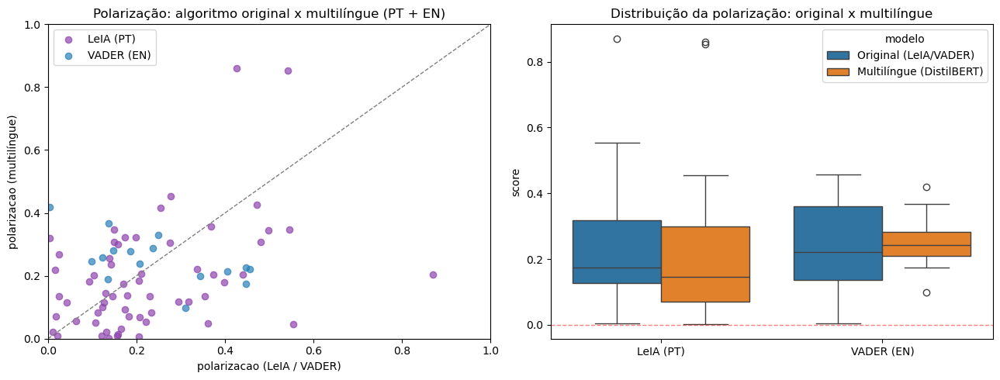

In [29]:
fig, axes = plt.subplots(1, 2, figsize=(13, 5))

# Dispersao: quanto mais perto da diagonal, mais o algoritmo original e o multilingue concordam
cores = {'LeIA (PT)': '#8e44ad', 'VADER (EN)': '#2980b9'}
for algoritmo, grupo in df_comp.groupby('algoritmo'):
    axes[0].scatter(grupo['polarizacao'], grupo['polarizacao_xlmr'], alpha=0.7,
                     color=cores.get(algoritmo), label=algoritmo)
lim = 1.0
axes[0].plot([0, lim], [0, lim], color='gray', linestyle='--', linewidth=1)
axes[0].axhline(0, color='gray', linewidth=0.8)
axes[0].axvline(0, color='gray', linewidth=0.8)
axes[0].set_xlim(0, lim)
axes[0].set_ylim(0, lim)
axes[0].set_xlabel('polarizacao (LeIA / VADER)')
axes[0].set_ylabel('polarizacao (multilíngue)')
axes[0].set_title('Polarização: algoritmo original x multilíngue (PT + EN)')
axes[0].legend()

# Distribuicao lado a lado: original x multilingue, separado por pais/algoritmo
comparacao_long = df_comp[['algoritmo', 'polarizacao', 'polarizacao_xlmr']].melt(
    id_vars='algoritmo', value_vars=['polarizacao', 'polarizacao_xlmr'],
    var_name='modelo', value_name='score'
)
comparacao_long['modelo'] = comparacao_long['modelo'].map(
    {'polarizacao': 'Original (LeIA/VADER)', 'polarizacao_xlmr': 'Multilíngue (DistilBERT)'}
)
sns.boxplot(data=comparacao_long, x='algoritmo', y='score', hue='modelo', ax=axes[1])
axes[1].axhline(0, color='red', linestyle='--', linewidth=1, alpha=0.5)
axes[1].set_title('Distribuição da polarização: original x multilíngue')
axes[1].set_xlabel('')

plt.tight_layout()
plt.show()

**Leitura sugerida:** pontos próximos à diagonal no gráfico de dispersão indicam votos em
que os dois algoritmos concordam sobre a polaridade; divergências grandes (fora da diagonal)
valem a pena olhar caso a caso — muitas vezes indicam trechos em que o léxico (LeIA/VADER)
reconhece poucas palavras "carregadas" (subestimando o sentimento) ou o transformer capta
contexto/negação que o léxico ignora. Nenhum dos dois é *ground truth*: o objetivo aqui é
robustez (ver se as conclusões do projeto se sustentam com um segundo algoritmo, tanto em
português quanto em inglês), não decidir qual dos dois está "certo". A coluna
`polaridade_xlmr` fica disponível para o restante do notebook, inclusive para a análise
conjunta e a inferência estatística mais adiante.

## Análise conjunta dos dados

In [30]:
# ============================================================================
# TABELA UNIFICADA: Métricas de sentimento (PT + EN), algoritmo original x multilíngue
# ============================================================================
# 'pais'/'corte' já identificam LeIA (PT, STF) x VADER (EN, SCOTUS); as colunas
# '..._xlmr' trazem o score do modelo multilíngue (calculado na seção anterior)
# lado a lado, para os dois países.

colunas_exibir = [
    'id', 'juiz', 'tipo_manifestacao', 'pais', 'corte',
    'polaridade', 'polarizacao', 'dispersao', 'amplitude', 'n_blocos',
    'polaridade_xlmr', 'polarizacao_xlmr', 'dispersao_xlmr', 'amplitude_xlmr',
]
colunas_exibir = [c for c in colunas_exibir if c in df.columns]

tabela_unificada = df[colunas_exibir].copy()
for c in tabela_unificada.select_dtypes('number').columns:
    tabela_unificada[c] = tabela_unificada[c].round(3)

# Filtra apenas linhas que têm dados de sentimento (PT ou EN)
tabela_com_dados = tabela_unificada[tabela_unificada['polaridade'].notna()]

print(f"Total de votos com análise de sentimento: {len(tabela_com_dados)}")
print(f"  - LeIA (PT): {(tabela_com_dados['pais'] == 'Brasil').sum()}")
print(f"  - VADER (EN): {(tabela_com_dados['pais'] == 'EUA').sum()}")
print("\n")

# Exibe a tabela completa
with pd.option_context('display.max_rows', None, 'display.max_colwidth', 60, 'display.width', 200):
    display(tabela_com_dados)

Total de votos com análise de sentimento: 77
  - LeIA (PT): 61
  - VADER (EN): 16




,id,juiz,tipo_manifestacao,pais,corte,polaridade,polarizacao,dispersao,amplitude,n_blocos,polaridade_xlmr,polarizacao_xlmr,dispersao_xlmr,amplitude_xlmr
0,1,Fachin,Condutora,Brasil,STF,0.004,0.004,0.672,1.917,160.0,-0.321,0.321,0.269,1.416
1,2,Moraes,Separada,Brasil,STF,-0.103,0.103,0.685,1.992,241.0,-0.203,0.203,0.320,1.565
2,3,Barroso,Separada,Brasil,STF,-0.317,0.317,0.526,1.706,12.0,-0.117,0.117,0.433,1.160
3,4,Carmen,Separada,Brasil,STF,0.294,0.294,0.696,1.888,9.0,-0.118,0.118,0.524,1.569
4,5,Gilmar,Separada,Brasil,STF,-0.276,0.276,0.565,1.874,98.0,-0.306,0.306,0.283,1.457
5,6,Marques,Separada,Brasil,STF,-0.254,0.254,0.619,1.924,76.0,-0.416,0.416,0.252,1.529
6,7,Mendonca,Separada,Brasil,STF,-0.024,0.024,0.561,1.954,258.0,-0.267,0.267,0.300,1.432
7,8,Toffoli,Separada,Brasil,STF,-0.498,0.498,0.527,1.749,37.0,-0.346,0.346,0.290,1.497
8,9,Weber,Separada,Brasil,STF,-0.158,0.158,0.613,1.945,78.0,-0.300,0.300,0.361,1.619
9,10,Dino,Separada,Brasil,STF,-0.016,0.016,0.689,1.953,68.0,-0.219,0.219,0.391,1.463


## Inferência estatística: índice de repercussão (IR) x polarização do voto

Esta seção testa H1 contra H0. A hipótese afirma que a repercussão midiática
aumenta o **afastamento da neutralidade** — uma *distância*, não uma direção.
Ela tem duas faces, testadas separadamente:

- **`polarizacao`** = |média dos blocos| — o centro de gravidade do voto se
  afasta do zero;
- **`dispersao`** = desvio-padrão dos blocos — a faixa de variação retórica
  interna se abre.

`polaridade` (a média **com sinal**) entra apenas como análise descritiva da
direção da carga: somada, ela cancela votos igualmente carregados em sentidos
opostos, que é exatamente o padrão que H1 prevê em casos de alta repercussão.

**Cuidados metodológicos.** (i) Cada caso tem um único `indice_reperc`
compartilhado por vários votos: o OLS usa erro-padrão agrupado por `caso` e o
teste final é por *wild cluster bootstrap*. (ii) A validação cruzada agrupa por
`caso` (`GroupKFold`), para que votos do mesmo caso nunca fiquem ao mesmo tempo
em treino e teste. (iii) Todas as métricas variam com o comprimento do voto, por
isso `log_n_blocos` entra como controle em todos os modelos.


In [31]:
# Bibliotecas para inferência estatística e machine learning (usadas apenas nesta seção)
from scipy import stats
import statsmodels.formula.api as smf
from sklearn.model_selection import GroupKFold, cross_validate
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.inspection import permutation_importance

### Base de modelagem


In [34]:
# =============================================================================
# BASE DE MODELAGEM (fonte unica para a descritiva, os modelos e o bootstrap)
# =============================================================================
df_ml = df.copy()

# indice_reperc ja foi convertido para float na celula de leitura; a checagem
# abaixo torna a celula segura caso ela seja executada isoladamente.
if not pd.api.types.is_numeric_dtype(df_ml['indice_reperc']):
    df_ml['indice_reperc'] = para_float_br(df_ml['indice_reperc'])

# Classe processual (ADI, ADPF, AP...) extraida do codigo do caso. So e
# informativa para o Brasil; nos EUA recebe rotulo constante.
df_ml['classe_processual'] = df_ml['caso'].str.extract(r'^([A-Za-z]+)')
df_ml.loc[df_ml['pais'] == 'EUA', 'classe_processual'] = 'SCOTUS'

df_ml['ano'] = pd.to_datetime(df_ml['data'], dayfirst=True, errors='coerce').dt.year


def categorizar_reperc(ir):
    if pd.isna(ir):
        return None
    if ir <= 0.3:
        return 'Baixa'
    return 'Média' if ir < 0.7 else 'Alta'


df_ml['categoria_repercussao'] = df_ml['indice_reperc'].apply(categorizar_reperc)

# Remove apenas votos sem NENHUM escore calculado.
df_ml = df_ml.dropna(subset=['polaridade', 'indice_reperc']).copy()

n_casos_br = df_ml.loc[df_ml['pais'] == 'Brasil', 'caso'].nunique()
n_casos_eua = df_ml.loc[df_ml['pais'] == 'EUA', 'caso'].nunique()
print(f"Base de modelagem: {len(df_ml)} votos em {df_ml['caso'].nunique()} casos "
      f"({n_casos_br} STF / {n_casos_eua} SCOTUS)")
print('\nDistribuicao por categoria de repercussao:')
print(pd.crosstab(df_ml['pais'], df_ml['categoria_repercussao']))

df_ml[['id', 'pais', 'caso', 'juiz', 'tipo_manifestacao', 'classe_processual',
       'indice_reperc', 'categoria_repercussao', 'polaridade', 'polarizacao',
       'dispersao', 'amplitude', 'n_blocos']].head(70).round(3)


Base de modelagem: 77 votos em 11 casos (7 STF / 4 SCOTUS)

Distribuicao por categoria de repercussao:
categoria_repercussao  Alta  Baixa  Média
pais                                     
Brasil                    5     56      0
EUA                       2      6      8


,id,pais,caso,juiz,tipo_manifestacao,classe_processual,indice_reperc,categoria_repercussao,polaridade,polarizacao,dispersao,amplitude,n_blocos
0,1,Brasil,AP1025,Fachin,Condutora,AP,0.035,Baixa,0.004,0.004,0.672,1.917,160.0
1,2,Brasil,AP1025,Moraes,Separada,AP,0.035,Baixa,-0.103,0.103,0.685,1.992,241.0
2,3,Brasil,AP1025,Barroso,Separada,AP,0.035,Baixa,-0.317,0.317,0.526,1.706,12.0
3,4,Brasil,AP1025,Carmen,Separada,AP,0.035,Baixa,0.294,0.294,0.696,1.888,9.0
4,5,Brasil,AP1025,Gilmar,Separada,AP,0.035,Baixa,-0.276,0.276,0.565,1.874,98.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
65,66,EUA,606 U.S. 831 (2025),Thomas,Separada,SCOTUS,0.000,Baixa,0.457,0.457,0.446,1.622,19.0
66,67,EUA,606 U.S. 831 (2025),Alito,Separada,SCOTUS,0.000,Baixa,0.405,0.405,0.524,1.572,13.0
67,68,EUA,606 U.S. 831 (2025),Kavanaugh,Separada,SCOTUS,0.000,Baixa,0.447,0.447,0.549,1.881,37.0
68,69,EUA,606 U.S. 831 (2025),Sotomayor,Separada,SCOTUS,0.000,Baixa,0.249,0.249,0.558,1.939,180.0


### Estatística descritiva e correlação

As correlações são reportadas **por voto** e **por caso**. A variável independente só varia entre casos: uma correlação computada sobre votos trata 77 observações como independentes quando, quanto ao índice de repercussão, há 11 informações repetidas.


Correlacao entre indice de repercussao e cada variavel dependente

         VD                           papel escopo    nivel  n  pearson  p_pearson  spearman  p_spearman
polarizacao H1  - distancia da neutralidade Pooled por voto 77   -0.001      0.993    -0.275       0.016
polarizacao H1  - distancia da neutralidade Pooled por caso 11    0.244      0.470    -0.178       0.600
polarizacao H1  - distancia da neutralidade Brasil por voto 61   -0.055      0.674    -0.409       0.001
polarizacao H1  - distancia da neutralidade Brasil por caso  7   -0.065      0.890    -0.607       0.148
polarizacao H1  - distancia da neutralidade    EUA por voto 16    0.126      0.643     0.031       0.910
polarizacao H1  - distancia da neutralidade    EUA por caso  4    0.557      0.443     0.400       0.600
  dispersao H1  - variacao retorica interna Pooled por voto 77   -0.071      0.538     0.013       0.907
  dispersao H1  - variacao retorica interna Pooled por caso 11   -0.290      0.387    -0.132 

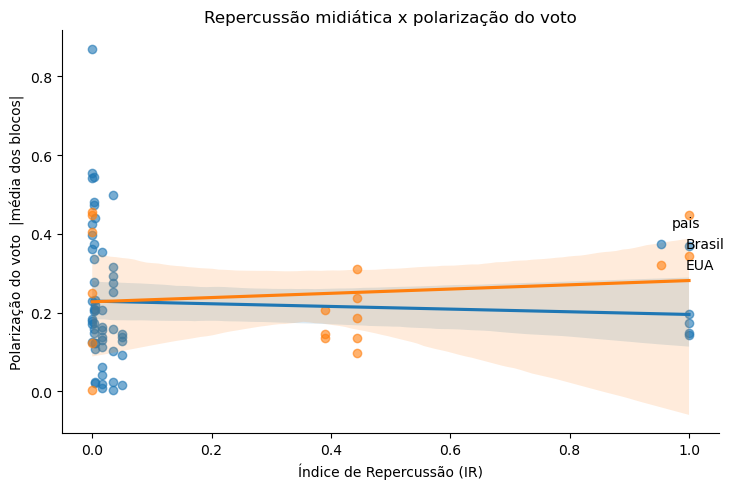

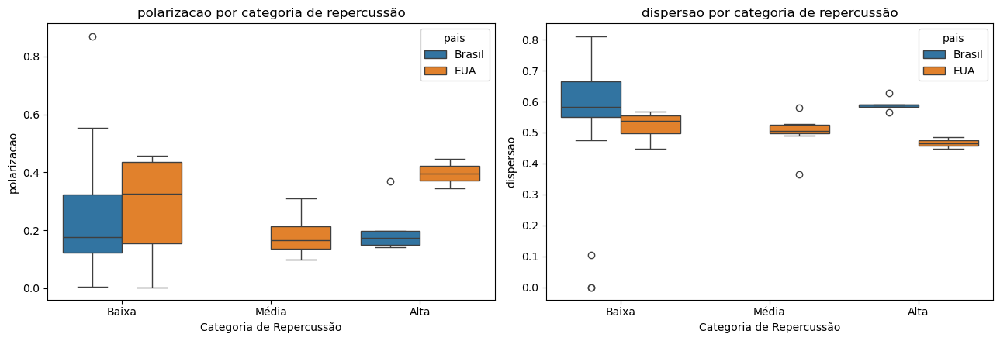

In [35]:
# =============================================================================
# ESTATISTICA DESCRITIVA E CORRELACAO
# Reportada em DOIS niveis:
#   - por voto  (n = 77): trata como independentes observacoes que compartilham
#                 o mesmo indice_reperc -> p-valores otimistas;
#   - por caso  (n = 11): nivel em que a variavel independente de fato varia.
# A distancia entre os dois numeros mostra quanto da forca aparente da
# associacao vem apenas da repeticao do mesmo valor de IR.
# =============================================================================
from scipy import stats

VDS = [
    ('polarizacao', 'H1  - distancia da neutralidade'),
    ('dispersao',   'H1  - variacao retorica interna'),
    ('polaridade',  'descritiva - direcao da carga'),
]


def correlacoes(dados, vd):
    """Pearson e Spearman entre indice_reperc e a VD."""
    sub = dados.dropna(subset=[vd, 'indice_reperc'])
    if len(sub) < 4 or sub['indice_reperc'].nunique() < 3:
        return None
    r, pr = stats.pearsonr(sub['indice_reperc'], sub[vd])
    rho, ps = stats.spearmanr(sub['indice_reperc'], sub[vd])
    return dict(n=len(sub), pearson=r, p_pearson=pr, spearman=rho, p_spearman=ps)


linhas_corr = []
for vd, papel in VDS:
    if vd not in df_ml.columns:
        continue
    for escopo in ['Pooled', 'Brasil', 'EUA']:
        base = df_ml if escopo == 'Pooled' else df_ml[df_ml['pais'] == escopo]
        for nivel in ['por voto', 'por caso']:
            if nivel == 'por caso':
                dados = (base.groupby('caso')
                             .agg({vd: 'mean', 'indice_reperc': 'first',
                                   'pais': 'first'})
                             .reset_index())
            else:
                dados = base
            res = correlacoes(dados, vd)
            if res:
                linhas_corr.append({'VD': vd, 'papel': papel, 'escopo': escopo,
                                    'nivel': nivel, **res})

tabela_corr = pd.DataFrame(linhas_corr)
print('Correlacao entre indice de repercussao e cada variavel dependente\n')
print(tabela_corr.round(3).to_string(index=False))
print('\nCompare as linhas "por voto" e "por caso" da mesma VD: se o p cai muito')
print('ao passar de uma para a outra, a significancia vinha da repeticao do IR.')

# --- graficos ----------------------------------------------------------------
VD_PRINCIPAL = 'polarizacao'
if VD_PRINCIPAL in df_ml.columns:
    g = sns.lmplot(data=df_ml, x='indice_reperc', y=VD_PRINCIPAL, hue='pais',
                   height=5, aspect=1.3, scatter_kws={'alpha': 0.6})
    g.set_axis_labels('Índice de Repercussão (IR)',
                      'Polarização do voto  |média dos blocos|')
    plt.title('Repercussão midiática x polarização do voto')
    plt.tight_layout()
    plt.show()

    fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))
    for ax, vd in zip(axes, ['polarizacao', 'dispersao']):
        sns.boxplot(data=df_ml, x='categoria_repercussao', y=vd,
                    order=['Baixa', 'Média', 'Alta'], hue='pais', ax=ax)
        ax.set_title(f'{vd} por categoria de repercussão')
        ax.set_xlabel('Categoria de Repercussão')
    plt.tight_layout()
    plt.show()


### Teste de hipótese: matriz de modelos

Três variáveis dependentes × dois algoritmos × três escopos. `polarizacao` e `dispersao` testam H1; `polaridade` responde à questão distinta da *direção* da carga e não decide a hipótese. A coluna `alerta` marca as especificações em que o número de casos é pequeno demais para que o p-valor assintótico seja utilizável.


In [36]:
# =============================================================================
# CELULA D - Matriz de modelos: 3 variaveis dependentes x 2 algoritmos
# Cada linha da tabela final e um modelo estimado por OLS com
# erro-padrao agrupado por caso.
# =============================================================================
import numpy as np
import pandas as pd
import statsmodels.formula.api as smf

# Usa df_ml preparado na secao anterior (fonte unica).
if 'df_ml' not in globals():
    raise NameError('Rode antes a celula "BASE DE MODELAGEM".')

# --- especificacoes ----------------------------------------------------------
# H1 tem DUAS faces: a carga desloca o centro (polarizacao) e/ou abre a faixa
# de variacao (dispersao). 'polaridade' entra so como analise descritiva de
# DIRECAO -- nao testa H1.
ESPECIFICACOES = [
    ('polarizacao',  'H1 - distancia da neutralidade'),
    ('dispersao',    'H1 - variacao retorica interna'),
    ('polaridade',   'descritiva - direcao da carga'),
]
ALGORITMOS = [('', 'LeIA/VADER'), ('_xlmr', 'Multilingue')]


def formulas(vd, sufixo, por_pais=None):
    """Devolve (formula irrestrita, formula sob H0: coef(indice_reperc)=0)."""
    controle = 'log_n_blocos' + sufixo
    if por_pais:
        f1 = f'{vd} ~ indice_reperc + tipo_manifestacao + {controle}'
        f0 = f'{vd} ~ tipo_manifestacao + {controle}'
    else:
        f1 = f'{vd} ~ indice_reperc * pais + tipo_manifestacao + {controle}'
        f0 = f'{vd} ~ pais + tipo_manifestacao + {controle}'
    return f1, f0


def ajustar(vd, sufixo, dados, por_pais=None):
    """OLS com erro-padrao agrupado por caso. Controla log do comprimento."""
    controle = 'log_n_blocos' + sufixo
    if por_pais:
        dados = dados[dados['pais'] == por_pais]
    f1, _ = formulas(vd, sufixo, por_pais)
    dados = dados.dropna(subset=[vd, 'indice_reperc', controle])
    if dados['caso'].nunique() < 3:
        return None, dados
    mod = smf.ols(f1, data=dados).fit(
        cov_type='cluster', cov_kwds={'groups': dados['caso']}
    )
    return mod, dados


linhas = []
modelos = {}
for sufixo, nome_alg in ALGORITMOS:
    vd_existe = all((vd + sufixo) in df_ml.columns for vd, _ in ESPECIFICACOES)
    if not vd_existe:
        print(f"[aviso] metricas de '{nome_alg}' ausentes - pulando")
        continue
    for vd_base, papel in ESPECIFICACOES:
        vd = vd_base + sufixo
        for escopo in [None, 'Brasil', 'EUA']:
            mod, dados = ajustar(vd, sufixo, df_ml, por_pais=escopo)
            if mod is None:
                continue
            chave = 'indice_reperc'
            linhas.append({
                'VD': vd_base,
                'papel': papel,
                'algoritmo': nome_alg,
                'escopo': escopo or 'Pooled',
                'coef_IR': mod.params.get(chave, np.nan),
                'ep': mod.bse.get(chave, np.nan),
                'p': mod.pvalues.get(chave, np.nan),
                'n_votos': int(mod.nobs),
                'n_casos': dados['caso'].nunique(),
                'R2': mod.rsquared,
                'k_params': int(mod.df_model) + 1,
            })
            modelos[(vd, escopo or 'Pooled')] = mod

tabela = pd.DataFrame(linhas)
tabela['sig'] = np.where(tabela['p'] < 0.05, '*', '')
# Com poucos agrupamentos o erro-padrao agrupado assintotico e otimista; abaixo
# de ~8 casos, ou com parametros demais para o n. de casos, o p nao e utilizavel.
tabela['alerta'] = np.where(
    (tabela['n_casos'] < 8) | (tabela['k_params'] >= tabela['n_casos']),
    'poucos casos', '')
print("\nCoeficiente do indice de repercussao em cada especificacao")
print("(erro-padrao agrupado por caso; * = p < 0.05)\n")
print(tabela.round(3).to_string(index=False))

print("\nLeitura: H1 so e sustentada se o coeficiente de 'polarizacao' e/ou")
print("'dispersao' for positivo e significante NOS DOIS algoritmos. A linha")
print("'polaridade' responde outra pergunta (direcao) e nao decide H1.")


Coeficiente do indice de repercussao em cada especificacao
(erro-padrao agrupado por caso; * = p < 0.05)

         VD                          papel   algoritmo escopo  coef_IR    ep     p  n_votos  n_casos    R2  k_params sig       alerta
polarizacao H1 - distancia da neutralidade  LeIA/VADER Pooled    0.182 0.062 0.003       77       11 0.263         6   *             
polarizacao H1 - distancia da neutralidade  LeIA/VADER Brasil    0.194 0.068 0.004       61        7 0.306         4   * poucos casos
polarizacao H1 - distancia da neutralidade  LeIA/VADER    EUA    0.050 0.151 0.742       16        4 0.094         4     poucos casos
  dispersao H1 - variacao retorica interna  LeIA/VADER Pooled   -0.081 0.057 0.155       77       11 0.147         6                 
  dispersao H1 - variacao retorica interna  LeIA/VADER Brasil   -0.079 0.071 0.265       61        7 0.085         4     poucos casos
  dispersao H1 - variacao retorica interna  LeIA/VADER    EUA   -0.058 0.015 0.000       

### Wild cluster bootstrap

Com onze agrupamentos, o erro-padrão agrupado assintótico é otimista e produz falsos positivos. Este é o teste recomendado para inferência com poucos agrupamentos (Cameron e Miller, 2015), e é **o p-valor que deve ir para a tese**.


In [37]:
# =============================================================================
# CELULA E - Wild cluster bootstrap (Rademacher)
# Com 11 casos, o erro-padrao agrupado assintotico e otimista. Este e o teste
# recomendado para poucos agrupamentos (Cameron e Miller, 2015).
# =============================================================================
def wild_cluster_bootstrap(f1, f0, dados, grupo='caso', alvo='indice_reperc',
                           n_boot=999, seed=42):
    """Teste de H0: coef(alvo) = 0, por bootstrap selvagem com restricao.

    f1 = formula irrestrita; f0 = mesma formula sem o termo alvo.
    """
    rng = np.random.default_rng(seed)
    formula = f1
    irrestrito = smf.ols(f1, data=dados).fit(
        cov_type='cluster', cov_kwds={'groups': dados[grupo]})
    t_obs = irrestrito.tvalues[alvo]
    restrito = smf.ols(f0, data=dados).fit()
    y_hat, resid = restrito.fittedvalues, restrito.resid

    grupos = dados[grupo].unique()
    vd = formula.split('~')[0].strip()
    ts = []
    for _ in range(n_boot):
        pesos = pd.Series(rng.choice([-1.0, 1.0], size=len(grupos)), index=grupos)
        d = dados.copy()
        d[vd] = y_hat + resid * dados[grupo].map(pesos).values
        try:
            m = smf.ols(formula, data=d).fit(
                cov_type='cluster', cov_kwds={'groups': d[grupo]})
            ts.append(m.tvalues[alvo])
        except Exception:
            continue
    ts = np.asarray(ts)
    p = float((np.abs(ts) >= abs(t_obs)).mean())
    return t_obs, p, len(ts)


print("\nWild cluster bootstrap para as especificacoes que testam H1:\n")
for sufixo, nome_alg in ALGORITMOS:
    for vd_base in ['polarizacao', 'dispersao']:
        vd = vd_base + sufixo
        if vd not in df_ml.columns:
            continue
        f1, f0 = formulas(vd, sufixo)
        d = df_ml.dropna(subset=[vd, 'indice_reperc', f'log_n_blocos{sufixo}'])
        try:
            t, p, nb = wild_cluster_bootstrap(f1, f0, d, n_boot=999)
            print(f"  {vd_base:<12} {nome_alg:<12} t = {t:>6.2f}   "
                  f"p(bootstrap) = {p:.3f}   ({nb} replicas)")
        except Exception as e:
            print(f"  {vd_base:<12} {nome_alg:<12} falhou: {e}")


Wild cluster bootstrap para as especificacoes que testam H1:

  polarizacao  LeIA/VADER   t =   2.94   p(bootstrap) = 0.193   (999 replicas)
  dispersao    LeIA/VADER   t =  -1.42   p(bootstrap) = 0.407   (999 replicas)
  polarizacao  Multilingue  t =   2.73   p(bootstrap) = 0.182   (999 replicas)
  dispersao    Multilingue  t =  -2.04   p(bootstrap) = 0.302   (999 replicas)


### Modelos preditivos e comparação de desempenho (Regressão Linear, Random Forest, Gradient Boosting)

A validação cruzada abaixo agrupa por `caso` (`GroupKFold`) em vez de usar um
`KFold` aleatório: como vários votos do mesmo caso compartilham o mesmo
`indice_reperc`, um `KFold` comum vazaria informação entre treino e teste e
inflaria artificialmente o desempenho estimado.

In [38]:
# =============================================================================
# MODELOS PREDITIVOS - uso EXPLORATORIO
# Duas mudancas em relacao a versao anterior:
#  1. A variavel-alvo passa a ser 'polarizacao' (a VD de H1), e nao a
#     polaridade com sinal.
#  2. 'amplitude' FOI REMOVIDA do conjunto de atributos. Ela e calculada sobre
#     a mesma serie de blocos de onde sai o alvo: usa-la como preditora nao e
#     predicao, e dependencia mecanica entre duas funcoes da mesma serie.
#  3. 'relator_ou_vogal' foi trocada por 'tipo_manifestacao', cujas categorias
#     existem nos dois paises (a versao antiga identificava 'pais' sozinha).
#  4. 'timeline_len' foi trocada por 'log_n_blocos': o efeito do comprimento
#     sobre as metricas e logaritmico, nao linear.
# =============================================================================
ALVO = 'polarizacao'

features_num = ['indice_reperc', 'log_n_blocos']
features_cat = ['pais', 'tipo_manifestacao', 'classe_processual']

dados_ml = df_ml.dropna(subset=features_num + [ALVO]).copy()
X = dados_ml[features_num + features_cat]
y = dados_ml[ALVO]
grupos = dados_ml['caso']

pre = ColumnTransformer([
    ('num', StandardScaler(), features_num),
    ('cat', OneHotEncoder(handle_unknown='ignore'), features_cat),
])

modelos_preditivos = {
    'Regressão Linear': LinearRegression(),
    'Random Forest': RandomForestRegressor(n_estimators=300, random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(random_state=42),
}

n_grupos = grupos.nunique()
n_splits = min(5, n_grupos)
gkf = GroupKFold(n_splits=n_splits)

resultados = []
for nome, modelo in modelos_preditivos.items():
    pipe = Pipeline([('pre', pre), ('modelo', modelo)])
    scores = cross_validate(
        pipe, X, y, groups=grupos, cv=gkf,
        scoring=['r2', 'neg_mean_absolute_error', 'neg_root_mean_squared_error']
    )
    resultados.append({
        'Modelo': nome,
        'R2_medio': scores['test_r2'].mean(),
        'MAE_medio': -scores['test_neg_mean_absolute_error'].mean(),
        'RMSE_medio': -scores['test_neg_root_mean_squared_error'].mean(),
    })

tabela_resultados = pd.DataFrame(resultados)
print(f"Alvo: {ALVO}  |  validação cruzada agrupada por 'caso' "
      f"({n_splits} folds, {n_grupos} casos)")
print('R2 negativo e esperado com n pequeno: significa que o modelo prevê pior')
print('que a média. Estes numeros sao diagnosticos, nao evidencia de H1.\n')
tabela_resultados


Alvo: polarizacao  |  validação cruzada agrupada por 'caso' (5 folds, 11 casos)
R2 negativo e esperado com n pequeno: significa que o modelo prevê pior
que a média. Estes numeros sao diagnosticos, nao evidencia de H1.



,Modelo,R2_medio,MAE_medio,RMSE_medio
0,Regressão Linear,-1.073551,0.154684,0.192662
1,Random Forest,-0.970252,0.140237,0.173253
2,Gradient Boosting,-1.588442,0.160061,0.192626


### Feature importance: quais variáveis mais influenciam a polarização?

A importância por **impureza** é enviesada a favor de variáveis com muitas categorias (Strobl *et al.*, 2007); a importância por **permutação** não é, e é calculada sobre as variáveis originais. As duas são reportadas lado a lado justamente para que a divergência entre elas fique visível.


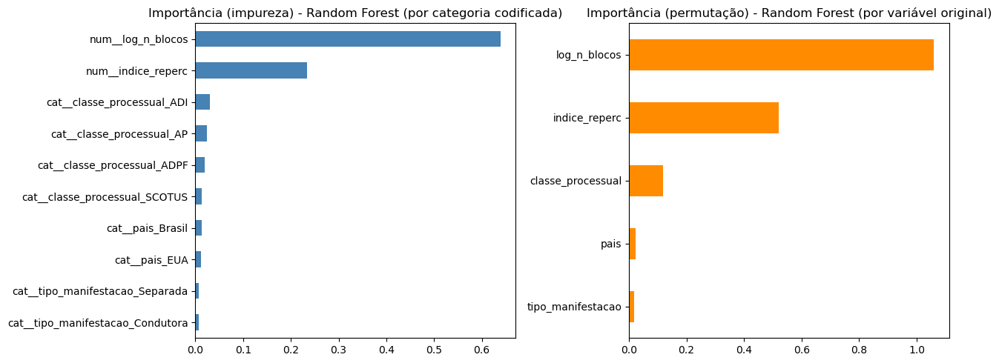

Coeficientes padronizados - Regressão Linear (alvo = polarizacao):
num__log_n_blocos                  -0.095086
cat__classe_processual_ADPF        -0.029523
cat__tipo_manifestacao_Separada    -0.014713
cat__pais_EUA                      -0.003017
cat__classe_processual_SCOTUS      -0.003017
cat__pais_Brasil                    0.003017
cat__classe_processual_ADI          0.008733
cat__tipo_manifestacao_Condutora    0.014713
cat__classe_processual_AP           0.023807
num__indice_reperc                  0.036367
dtype: float64


In [39]:
# Ajusta o Random Forest em toda a base para extrair as importancias
# (uso descritivo/exploratorio, dado o n pequeno atual)
# Usa exatamente o mesmo 'pre', X e y definidos na celula anterior (alvo = polarizacao)
pipe_rf = Pipeline([('pre', pre), ('modelo', RandomForestRegressor(n_estimators=300, random_state=42))])
pipe_rf.fit(X, y)

nomes_features_encoded = pipe_rf.named_steps['pre'].get_feature_names_out()

# Importancia por impureza (rapida, mas enviesada para variaveis com muitas categorias)
# -> calculada sobre as colunas JA CODIFICADAS (one-hot) que o modelo enxerga
importancia_impureza = pd.Series(
    pipe_rf.named_steps['modelo'].feature_importances_, index=nomes_features_encoded
).sort_values(ascending=False)

# Importancia por permutacao (mais confiavel: mede a queda de performance ao embaralhar cada feature)
# -> calculada sobre as colunas ORIGINAIS de X (o pipeline completo e tratado como caixa-preta,
#    entao cada coluna original - antes do one-hot - e embaralhada uma de cada vez)
perm = permutation_importance(pipe_rf, X, y, n_repeats=30, random_state=42, scoring='r2')
importancia_permutacao = pd.Series(perm.importances_mean, index=X.columns).sort_values(ascending=False)

fig, axes = plt.subplots(1, 2, figsize=(13, 5))
importancia_impureza.head(10).sort_values().plot.barh(ax=axes[0], color='steelblue')
axes[0].set_title('Importância (impureza) - Random Forest (por categoria codificada)')
importancia_permutacao.sort_values().plot.barh(ax=axes[1], color='darkorange')
axes[1].set_title('Importância (permutação) - Random Forest (por variável original)')
plt.tight_layout()
plt.show()

# Coeficientes padronizados da regressao linear, para comparar sinal e magnitude
pipe_lr = Pipeline([('pre', pre), ('modelo', LinearRegression())])
pipe_lr.fit(X, y)
coef_lr = pd.Series(pipe_lr.named_steps['modelo'].coef_, index=nomes_features_encoded).sort_values()
print(f"Coeficientes padronizados - Regressão Linear (alvo = {ALVO}):")
print(coef_lr)

### Observações e limitações desta seção

- **Amostra pequena e agrupada.** São 77 votos em 11 casos. O que limita a
  inferência é o número de **casos**, não o de votos: a variável independente
  varia apenas entre casos. Especificações com menos de oito casos são marcadas
  com `alerta` e seus p-valores não devem ser reportados.

- **O p-valor que vale é o do bootstrap.** Com onze agrupamentos, o
  erro-padrão agrupado assintótico produz falsos positivos. Em teste com
  timelines aleatórias — efeito verdadeiro igual a zero por construção — o OLS
  agrupado devolveu p = 0,007 e p = 0,038 em especificações sem qualquer sinal,
  enquanto o *wild cluster bootstrap* devolveu p > 0,45 em todas elas.

- **Amplitude não é métrica inferencial.** `amplitude` (máx − mín) cresce
  mecanicamente com o número de blocos: em simulação com a mesma distribuição
  subjacente, ela sobe 131% ao passar de 10 para 640 blocos, enquanto
  `dispersao` (desvio-padrão) sobe apenas 12%. Como os votos do STF são muito
  mais longos que as manifestações da SCOTUS, usar amplitude produziria uma
  diferença Brasil × EUA que é puro artefato de comprimento. Ela permanece na
  base como estatística descritiva.

- **`polarizacao` também depende do comprimento, em sentido oposto.** A média
  de votos longos é menos ruidosa, então |média| encolhe conforme o voto cresce
  (−87% na mesma simulação). Por isso `log_n_blocos` entra como controle em
  **todos** os modelos, e o log — e não o comprimento cru — é a forma funcional
  correta.

- **Confusão entre `pais` e as variáveis estruturais.** `classe_processual` só
  é informativa para o Brasil. `relator_ou_vogal` foi substituída por
  `tipo_manifestacao` justamente porque suas categorias originais não se
  sobrepunham entre os países e identificavam `pais` sozinhas, tornando o
  modelo colinear.

- **Confusão entre algoritmo e país.** No *pipeline* lexical, LeIA só roda em
  português e VADER só em inglês, de modo que "algoritmo" e "país" são a mesma
  variável. O modelo multilíngue existe para quebrar essa confusão: uma
  conclusão só é robusta se se mantiver nos dois.

- **Confusão entre tema e carga.** Termos lexicalmente negativos e tecnicamente
  neutros ("crime", "fraude", "violência") fazem votos em ação penal parecerem
  negativos por **matéria**, não por retórica. Como os casos brasileiros de alta
  repercussão são ações penais, convém comparar votos **dentro** de um mesmo
  caso, onde o tema é constante e só o julgador varia.

## Exportando o DataFrame consolidado para CSV

Antes da limpeza pesada de texto feita só para a nuvem de palavras (que descarta
informação e não deve ser usada em outras análises), esta célula salva o DataFrame
principal — com todas as colunas geradas até aqui (LeIA, VADER, modelo multilíngue,
métricas unificadas etc.) — em um `.csv`, facilitando a visualização
em outras ferramentas e futuras análises sem precisar reexecutar o notebook inteiro.

In [ ]:
CSV_SAIDA = 'A1_resultados_sentimento.csv'

# Colunas com o texto bruto/limpo dos votos: ficam de fora do CSV para nao poluir
# o arquivo (o texto continua disponivel em 'df' para as celulas seguintes, como a
# limpeza pesada e a nuvem de palavras).
colunas_texto_votos = ['texto_completo', 'texto_limpo_sentimento', 'texto_limpo_sentimento_en']
df_export = df.drop(columns=[c for c in colunas_texto_votos if c in df.columns])

df_export.to_csv(CSV_SAIDA, sep=';', index=False, encoding='utf-8-sig')
print(f"DataFrame exportado para '{CSV_SAIDA}' ({df_export.shape[0]} linhas x {df_export.shape[1]} colunas).")

## Limpeza pesada para Nuvem de Palavras (PT + EN)
Aplica `limpeza_pesada()` nos textos completos para remoção de stopwords, stemming e normalização. Esses textos processados serão usados na geração das nuvens de palavras.

In [ ]:
# ============================================================================
# LIMPEZA PESADA: Prepara textos para Nuvem de Palavras e Modelagem de Tópicos
# ============================================================================
# Aplica limpeza_pesada() (lowercase, remove pontuação/números, stopwords, stemming)
# Resultado armazenado em 'texto_limpo_pesado' (coluna unificada PT + EN)

# Instancia os limpadores (já definidos anteriormente)
cleaner_pt = TextCleaner()
cleaner_en_pesado = TextCleanerEnglish()

# Cria máscaras
mascara_portugues, mascara_ingles = mascaras_idioma(df)


# Inicializa coluna unificada
df['texto_limpo_pesado'] = ''

# Aplica limpeza pesada para PT
print("Aplicando limpeza pesada nos votos em português...")
df.loc[mascara_portugues, 'texto_limpo_pesado'] = df.loc[mascara_portugues, 'texto_completo'].apply(cleaner_pt.limpeza_pesada)

# Aplica limpeza pesada para EN
print("Aplicando limpeza pesada nos votos em inglês...")
df.loc[mascara_ingles, 'texto_limpo_pesado'] = df.loc[mascara_ingles, 'texto_completo'].apply(cleaner_en_pesado.limpeza_pesada)

# Verificação
total_pt = (mascara_portugues & (df['texto_limpo_pesado'].str.len() > 0)).sum()
total_en = (mascara_ingles & (df['texto_limpo_pesado'].str.len() > 0)).sum()
print(f"\nLimpeza pesada concluída:")
print(f"  - Votos PT processados: {total_pt}")
print(f"  - Votos EN processados: {total_en}")

# Preview rápido
print("\n--- Preview (primeiros 200 chars de cada texto limpo) ---\n")
for _, row in df[df['texto_limpo_pesado'].str.len() > 0].head(4).iterrows():
    print(f"ID: {row['id']} | Juiz: {row['juiz']} | País: {row['pais']}")
    print(f"  {row['texto_limpo_pesado'][:200]}...")
    print()

## Nuvem de Palavras (Word Cloud)
Gera nuvens de palavras a partir dos textos com limpeza pesada. 
Os filtros são facilmente configuráveis na seção `CONFIGURAÇÃO` no início da célula.

In [ ]:
from wordcloud import WordCloud

# ============================================================================
# ⚙️  CONFIGURAÇÃO - Altere os filtros abaixo conforme necessário
# ============================================================================
# Cada filtro aceita:
#   - None → sem filtro (usa todos os dados disponíveis)
#   - Um valor → ex: 'Barroso'
#   - Uma lista → ex: ['Barroso', 'Moraes']

FILTRO_JUIZ  = 'Barroso'   # Ex: 'Barroso', ['Barroso', 'Moraes'] ou None
FILTRO_CASO  = None   # Ex: 'Marco Civil', ['HC 123', 'ADI 456'] ou None
FILTRO_CORTE = None   # Ex: 'STF', 'SCOTUS', ['STF', 'SCOTUS'] ou None

# Configurações visuais
LARGURA    = 1200       # Largura da imagem (px)
ALTURA     = 600        # Altura da imagem (px)
MAX_WORDS  = 200        # Número máximo de palavras na nuvem
BACKGROUND = 'white'    # Cor de fundo ('white', 'black', etc.)

# ============================================================================
# APLICAÇÃO DOS FILTROS
# ============================================================================
def aplicar_filtros(dataframe, juiz=None, caso=None, corte=None):
    """Aplica filtros ao DataFrame e retorna o subconjunto filtrado."""
    mascara = pd.Series([True] * len(dataframe), index=dataframe.index)
    
    if juiz is not None:
        if isinstance(juiz, str):
            juiz = [juiz]
        mascara &= dataframe['juiz'].isin(juiz)
    
    if caso is not None:
        if isinstance(caso, str):
            caso = [caso]
        mascara &= dataframe['caso'].isin(caso)
    
    if corte is not None:
        if isinstance(corte, str):
            corte = [corte]
        mascara &= dataframe['corte'].isin(corte)
    
    return dataframe[mascara]

# Filtra os dados
df_filtrado = aplicar_filtros(df, juiz=FILTRO_JUIZ, caso=FILTRO_CASO, corte=FILTRO_CORTE)

# Separa PT e EN dentro dos dados filtrados
mascara_pt, mascara_en = mascaras_idioma(df_filtrado, verbose=False)


df_pt = df_filtrado[mascara_pt]
df_en = df_filtrado[mascara_en]

# Concatena todos os textos limpos (pesados) em uma única string
texto_pt = ' '.join(df_pt['texto_limpo_pesado'].dropna().astype(str).tolist())
texto_en = ' '.join(df_en['texto_limpo_pesado'].dropna().astype(str).tolist())

# ============================================================================
# DESCRIÇÃO DOS FILTROS APLICADOS (para título dos gráficos)
# ============================================================================
def descrever_filtros(juiz, caso, corte):
    """Gera string descritiva dos filtros ativos."""
    partes = []
    if juiz is not None:
        partes.append(f"Juiz: {juiz if isinstance(juiz, str) else ', '.join(juiz)}")
    if caso is not None:
        partes.append(f"Caso: {caso if isinstance(caso, str) else ', '.join(caso)}")
    if corte is not None:
        partes.append(f"Corte: {corte if isinstance(corte, str) else ', '.join(corte)}")
    return ' | '.join(partes) if partes else 'Todos os votos'

descricao_filtros = descrever_filtros(FILTRO_JUIZ, FILTRO_CASO, FILTRO_CORTE)

# ============================================================================
# GERAÇÃO DAS NUVENS DE PALAVRAS
# ============================================================================
print(f"Filtros aplicados: {descricao_filtros}")
print(f"  - Votos PT encontrados: {len(df_pt)}")
print(f"  - Votos EN encontrados: {len(df_en)}")
print()

# --- Nuvem de Palavras: Português ---
if texto_pt.strip():
    wc_pt = WordCloud(
        width=LARGURA, height=ALTURA,
        max_words=MAX_WORDS,
        background_color=BACKGROUND,
        colormap='Blues',
        collocations=False,
        min_word_length=3
    ).generate(texto_pt)

    fig_pt, ax_pt = plt.subplots(figsize=(14, 7))
    ax_pt.imshow(np.array(wc_pt.to_image()), interpolation='bilinear')
    ax_pt.axis('off')
    ax_pt.set_title(f"Nuvem de Palavras — Português (LeIA)\n{descricao_filtros}", fontsize=14, pad=15)
    fig_pt.tight_layout()
    plt.show()
else:
    print("⚠️  Sem dados em português para os filtros selecionados.")

# --- Nuvem de Palavras: Inglês ---
if texto_en.strip():
    wc_en = WordCloud(
        width=LARGURA, height=ALTURA,
        max_words=MAX_WORDS,
        background_color=BACKGROUND,
        colormap='Reds',
        collocations=False,
        min_word_length=3
    ).generate(texto_en)

    fig_en, ax_en = plt.subplots(figsize=(14, 7))
    ax_en.imshow(np.array(wc_en.to_image()), interpolation='bilinear')
    ax_en.axis('off')
    ax_en.set_title(f"Word Cloud — English (VADER)\n{descricao_filtros}", fontsize=14, pad=15)
    fig_en.tight_layout()
    plt.show()
else:
    print("⚠️  Sem dados em inglês para os filtros selecionados.")